In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import os
import torch
import time
import pickle
import seaborn as sns
import scipy.stats

In [2]:
import matplotlib.pyplot as plt

SMALL_SIZE =  14
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


In [3]:
sys.path.append('/global/u2/v/vboehm/codes/SIG_GIS/')
from sig_gis import *
from sig_gis.GIS import *

In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [5]:
classes = {2:'GAL', 1:'QSO', 0:'STAR'}

In [6]:
plotpath = '/global/homes/v/vboehm/codes/SDSS_PAE/figures'

In [7]:
RUN             = '1'
EPOCHS          = 40

seeds           = {'1':512, '2':879, '3':9981, '4': 20075, '5': 66, '6': 276, '7': 936664}

conditional     = False
cond_on         = 'type'

root_model_data = '/global/cscratch1/sd/vboehm/Datasets/sdss/by_model/'
root_models     = '/global/cscratch1/sd/vboehm/Models/SDSS_AE/'
root_encoded    = '/global/cscratch1/sd/vboehm/Datasets/encoded/sdss/'
root_decoded    = '/global/cscratch1/sd/vboehm/Datasets/decoded/sdss/'


wlmin, wlmax    = (3388,8318)
fixed_num_bins  = 1000
min_SN          = 50
min_z           = 0.1
max_z           = 0.36
label           = 'galaxies_quasars_bins%d_wl%d-%d'%(fixed_num_bins,wlmin,wlmax)
label_          = label+'_minz%s_maxz%s_minSN%d'%(str(int(min_z*100)).zfill(3),str(int(max_z*100)).zfill(3),min_SN)
label_2         = label_+'_10_fully_connected_mean_div'

if conditional:
    label_2='conditional_%s'%cond_on+label_2
    
upsampling      = 'SMOTE'
fac             = 10

In [8]:
decoded = {}
masked  = {}

In [9]:
encoded_train, encoded_valid, encoded_test = np.load(os.path.join(root_encoded,'encoded_AE2_%s_RUN%s.npy'%(label_2, RUN)), allow_pickle=True)
decoded['train'],decoded['valid'], decoded['test'], mean, std  = np.load(os.path.join(root_decoded,'decoded_%s.npy'%(label_2)), allow_pickle=True)

In [10]:
train,valid,test,le = pickle.load(open(os.path.join(root_model_data,'combined_%s.pkl'%label_),'rb'))

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator LabelEncoder from version 0.22.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


602 52072 358 0.33435795


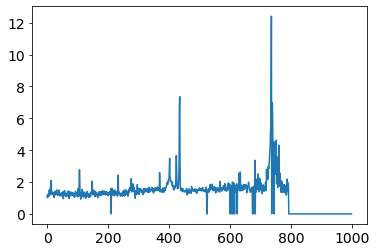

In [20]:

plt.plot(train['spec'][0])

print(train['plate'][0], train['MJD'][0], train['fiber'][0], train['z'][0])

617 52072 618 0.33501092


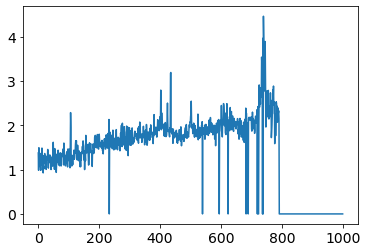

In [23]:
ii=1
plt.plot(test['spec'][ii])

print(test['plate'][ii], test['MJD'][ii], test['fiber'][ii], test['z'][ii])

In [24]:
label, count = np.unique(train['subclass'],return_counts=True)
print(le.inverse_transform(label))
print(count)

[b'' b'AGN' b'AGN BROADLINE' b'BROADLINE' b'STARBURST'
 b'STARBURST BROADLINE' b'STARFORMING' b'STARFORMING BROADLINE']
[43226   460   185  2289  3668  2381  1509   116]


In [25]:
train_x = torch.Tensor(np.squeeze(encoded_train)).to(device) 
train_y = torch.Tensor(train['subclass']).to(torch.long).to(device)

valid_x = torch.Tensor(np.squeeze(encoded_valid)).to(device) 
valid_y = torch.Tensor(valid['subclass']).to(torch.long).to(device)

test_x = torch.Tensor(np.squeeze(encoded_test)).to(device) 
test_y = torch.Tensor(test['subclass']).to(torch.long).to(device)

In [26]:
np.unique(train['class'])

array([1, 2])

In [27]:
model = torch.load(os.path.join(root_models,'conditional_SINF_%s_%s_%d_AE_2_inpainted_denoised'%(label_2,upsampling,fac)))

In [28]:
dens_train     = model.evaluate_density(train_x,train_y).cpu().numpy()
dens_valid     = model.evaluate_density(valid_x,valid_y).cpu().numpy()
dens_test      = model.evaluate_density(test_x,test_y).cpu().numpy()

In [29]:
masked['train'] = np.ma.array(np.squeeze(train['spec']),mask=~np.squeeze(train['mask'].astype('bool')))
masked['valid'] = np.ma.array(np.squeeze(valid['spec']),mask=~np.squeeze(valid['mask'].astype('bool')))
masked['test']  = np.ma.array(np.squeeze(test['spec']),mask=~np.squeeze(test['mask'].astype('bool')))

In [30]:
df_train         = pd.DataFrame.from_dict(dict((k,train[k]) for k in ('MJD','fiber','plate','subclass','class') if k in train))
df_train['logp'] = dens_train
df_train['mask_fracs'] = np.sum(~train['mask'].astype('bool'),axis=1)/1000
df_train['z']    = train['z']
noise            = np.ma.array(np.squeeze(train['noise']),mask=~np.squeeze(train['mask'].astype('bool')))
df_train['recon_error']     = np.ma.mean(np.ma.array(np.squeeze(train['spec'])-decoded['train'],mask=~np.squeeze(train['mask'].astype('bool')))**2*noise,axis=1)
df_train['max_recon_error'] = np.ma.max(np.ma.array(np.squeeze(train['spec'])-decoded['train'],mask=~np.squeeze(train['mask'].astype('bool')))**2*noise,axis=1)
df_train = df_train.reset_index()

In [31]:
df_test         = pd.DataFrame.from_dict(dict((k,test[k]) for k in ('MJD','fiber','plate','subclass') if k in test))
df_test['logp'] = dens_test
df_test['mask_fracs'] = np.sum(~test['mask'].astype('bool'),axis=1)/1000
df_test['z']    = test['z']
noise           = np.ma.array(np.squeeze(test['noise']),mask=~np.squeeze(test['mask'].astype('bool')))
df_test['recon_error']     = np.ma.mean(np.ma.array(np.squeeze(test['spec'])-decoded['test'],mask=~np.squeeze(test['mask'].astype('bool')))**2*noise,axis=1)
df_test['max_recon_error'] = np.ma.max(np.ma.array(np.squeeze(test['spec'])-decoded['test'],mask=~np.squeeze(test['mask'].astype('bool')))**2*noise,axis=1)
df_test = df_test.reset_index()

In [32]:
df_valid         = pd.DataFrame.from_dict(dict((k,valid[k]) for k in ('MJD','fiber','plate','subclass') if k in valid))
df_valid['logp'] = dens_valid
df_valid['mask_fracs'] = np.sum(~valid['mask'].astype('bool'),axis=1)/1000
df_valid['z']    = valid['z']
noise            = np.ma.array(np.squeeze(valid['noise']),mask=~np.squeeze(valid['mask'].astype('bool')))
df_valid['recon_error']     = np.ma.mean(np.ma.array(np.squeeze(valid['spec'])-decoded['valid'],mask=~np.squeeze(valid['mask'].astype('bool')))**2*noise,axis=1)
df_valid['max_recon_error'] = np.ma.max(np.ma.array(np.squeeze(valid['spec'])-decoded['valid'],mask=~np.squeeze(valid['mask'].astype('bool')))**2*noise,axis=1)
df_valid = df_valid.reset_index()

In [35]:
df_train['fiber'][0]

358

In [36]:
import sklearn.linear_model
import sklearn.kernel_ridge
LRl = sklearn.linear_model.LinearRegression()

In [37]:
def fit_regression(data_,class_):
    ind = (data_['subclass']==class_)
    LRl.fit((data_['mask_fracs']**2)[ind,None],data_['logp'][ind,None])
    ind = (data_['subclass']==class_)
    h =plt.hist2d(data_['mask_fracs'][ind], data_['logp'][ind], range=[[0.1,0.36],[-50,50]], bins=[40,40])
    plt.plot(data_['mask_fracs'][ind,None],LRl.predict((data_['mask_fracs']**2)[ind,None]), ls='',marker='.')
    plt.show()
    return ind, data_['logp'][ind,None]-LRl.predict((data_['mask_fracs']**2)[ind,None]), LRl

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


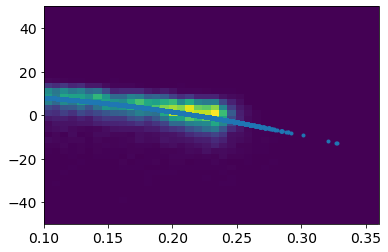

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


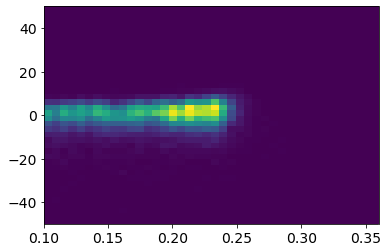

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


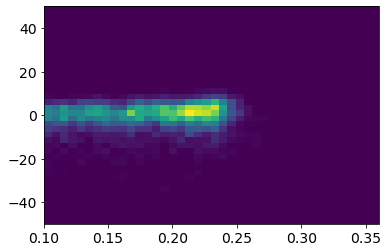

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


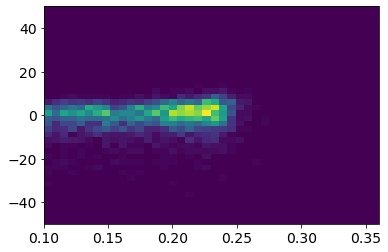

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


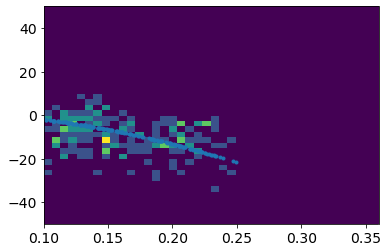

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


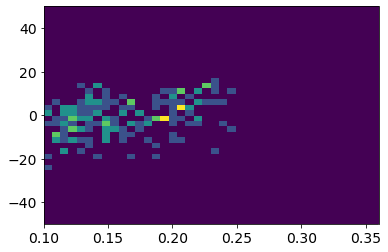

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


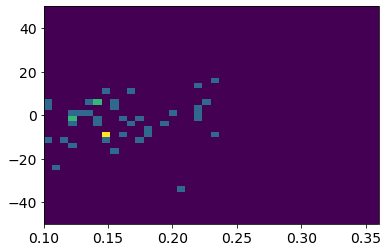

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


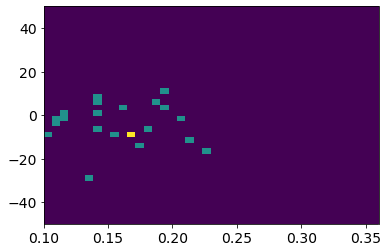

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


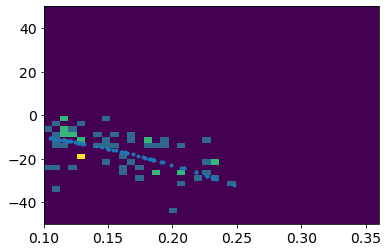

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


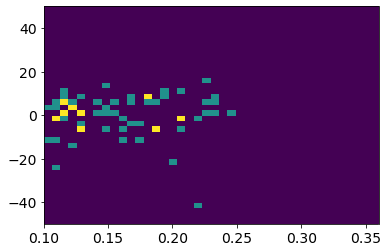

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


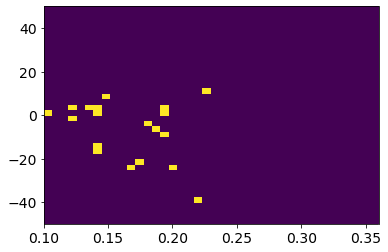

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


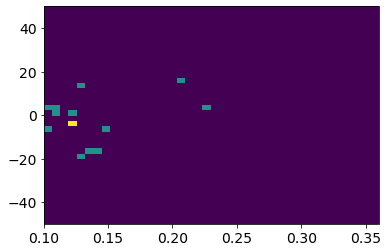

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


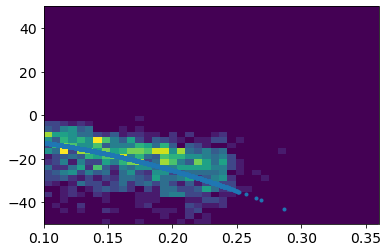

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


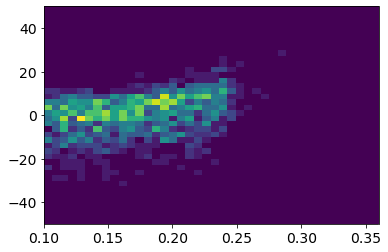

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


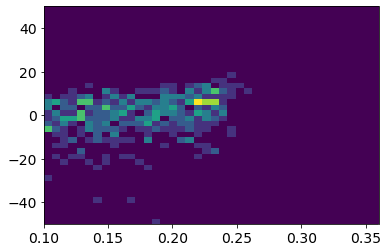

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


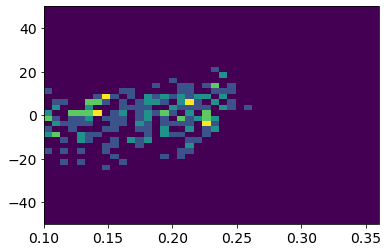

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


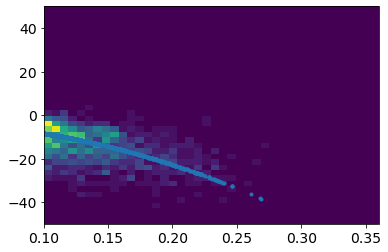

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


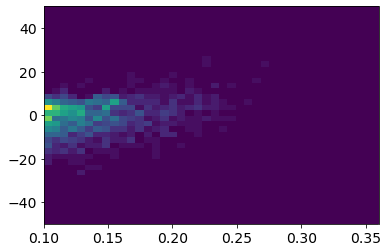

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


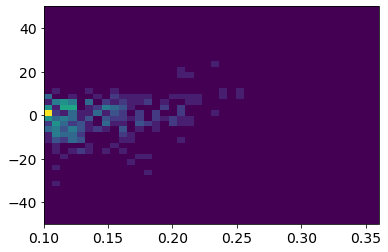

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


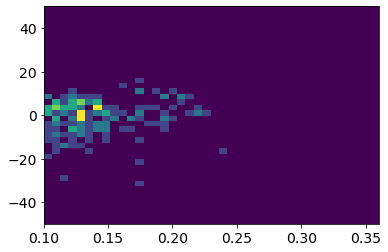

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


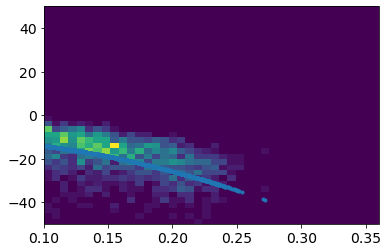

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


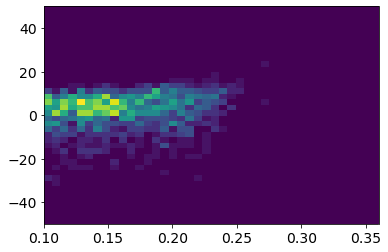

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


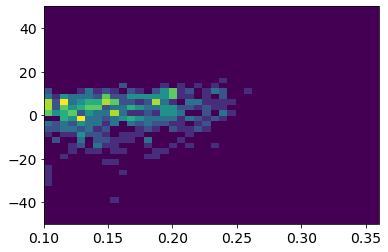

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


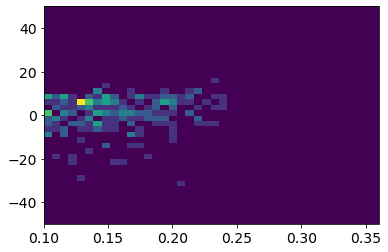

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


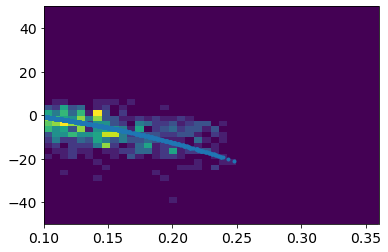

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  


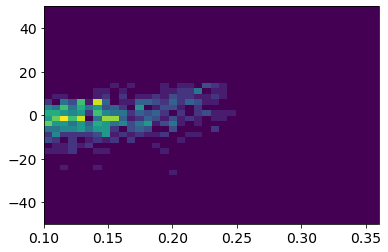

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


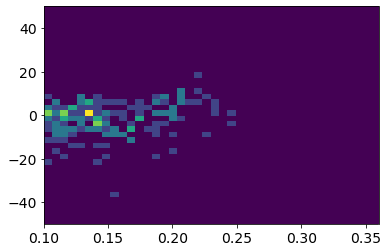

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


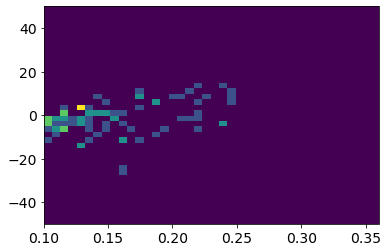

In [38]:
for ii in range(7):
    for jj, df_ in enumerate([df_train, df_valid, df_test]):
        if jj ==0:
            if ii==0:
                df_['logp_corr'] = np.zeros((len(df_)))
            ind, val, LRl = fit_regression(df_,ii)
        else:
            ind = (df_['subclass']==ii)
            val = df_['logp'][ind,None]-LRl.predict((df_['mask_fracs']**2)[ind,None])
        df_.loc[ind.to_numpy(), 'logp_corr'] = val[:,0]
        h =plt.hist2d(df_['mask_fracs'][ind], df_['logp_corr'][ind], range=[[0.1,0.36],[-50,50]], bins=[40,40])
        plt.show()

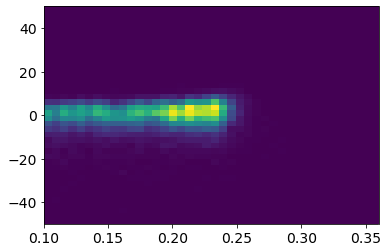

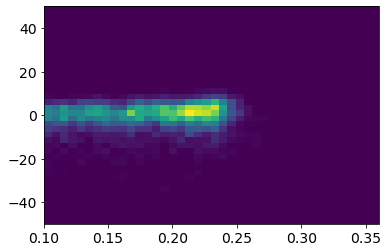

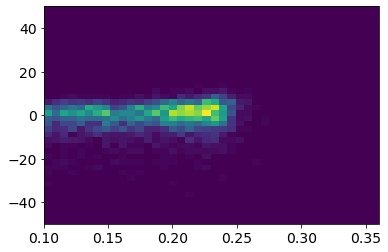

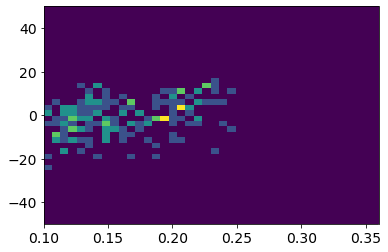

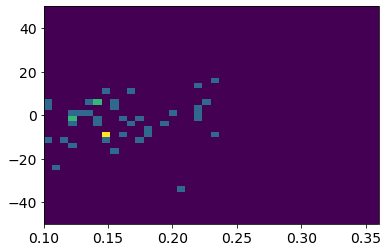

...

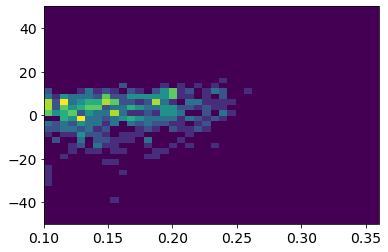

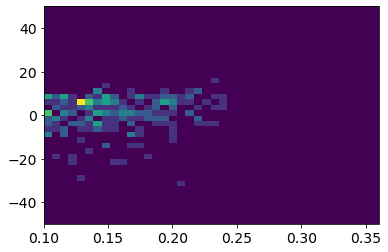

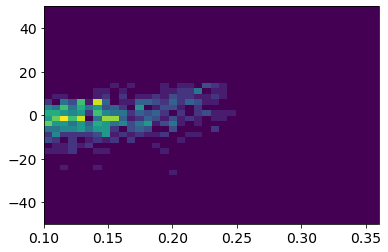

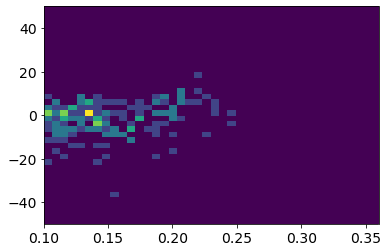

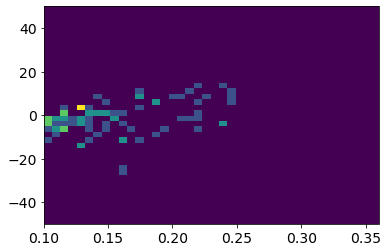

In [39]:
for ii in range(7):
    for jj, df_ in enumerate([df_train, df_valid, df_test]):
        ind = (df_['subclass']==ii)        
        h =plt.hist2d(df_['mask_fracs'][ind], df_['logp_corr'][ind], range=[[0.1,0.36],[-50,50]], bins=[40,40])
        plt.show()

In [40]:
corr, _= scipy.stats.pearsonr(df_train['mask_fracs'],-df_train['logp'])
print(corr)
corr, _= scipy.stats.pearsonr(df_train['mask_fracs'],df_train['logp_corr'])
print(corr)
corr, _= scipy.stats.pearsonr(df_train['mask_fracs'],df_train['z'])
print(corr)
corr, _= scipy.stats.pearsonr(-df_train['logp'],df_train['z'])
print(corr)

0.18181766464895804
-0.011790751191991569
0.993201919240495
0.17541060931131283


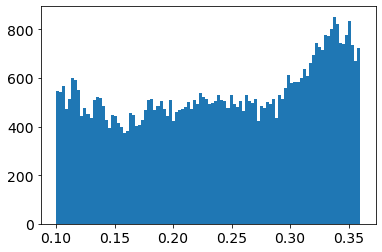

In [41]:
_ = plt.hist(df_train['z'],bins=100)

Text(0.5, 0, 'mask_fracs')

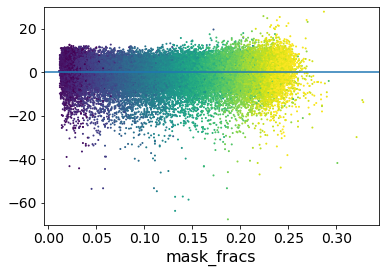

In [42]:
plt.scatter(df_train['mask_fracs'],df_train['logp_corr'], s=1, c=df_train['z'])
plt.axhline(0)
plt.ylim(-70,30)
plt.xlabel('mask_fracs')

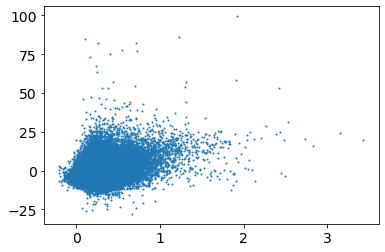

In [43]:
plt.scatter(np.log(df_train['recon_error'][df_train['logp_corr']>-100]),-df_train['logp_corr'][df_train['logp_corr']>-100],s=1)

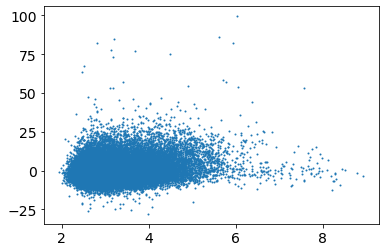

In [44]:
plt.scatter(np.log(df_train['max_recon_error'][df_train['logp_corr']>-100]),-df_train['logp_corr'][df_train['logp_corr']>-100],s=1)

In [45]:
scipy.stats.pearsonr(np.log(df_train['recon_error']),df_train['logp_corr'])

(-0.14813887935884787, 9.590592273472811e-262)

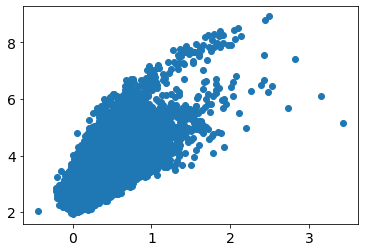

In [46]:
plt.scatter(np.log(df_train['recon_error']),np.log(df_train['max_recon_error']))

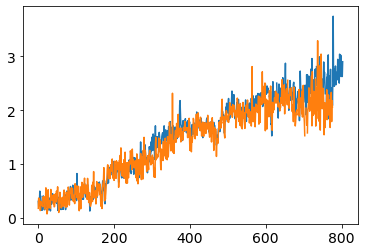

In [47]:
plt.plot(masked['valid'][0])
plt.plot(masked['test'][0])

In [48]:
res=[]
for spec in decoded['test']:
    res.append(np.mean((decoded['valid'][0]-spec)**2))

In [38]:
for spec in test['spec']:
    res.append(np.mean((valid['spec'][0]-spec)**2))

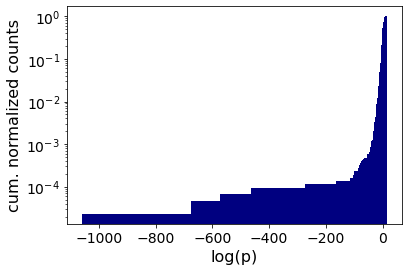

Anomalous Spectra train 0


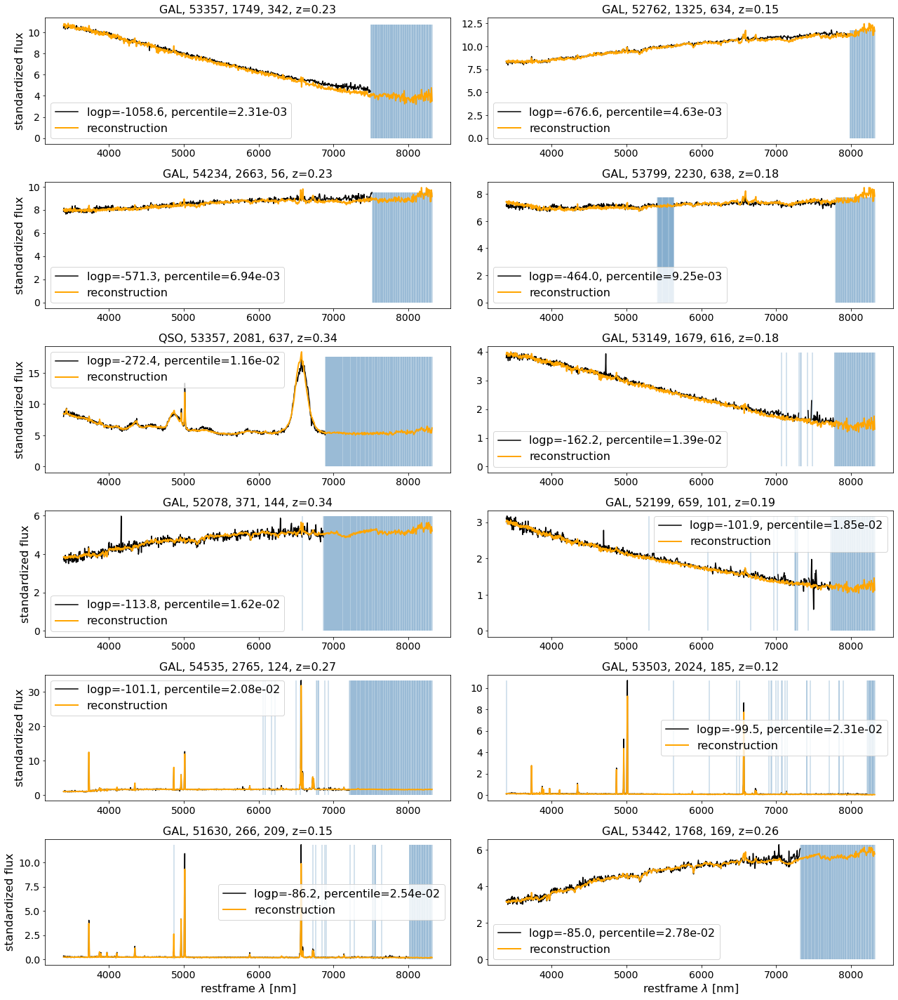

Most normal Spectra train 0


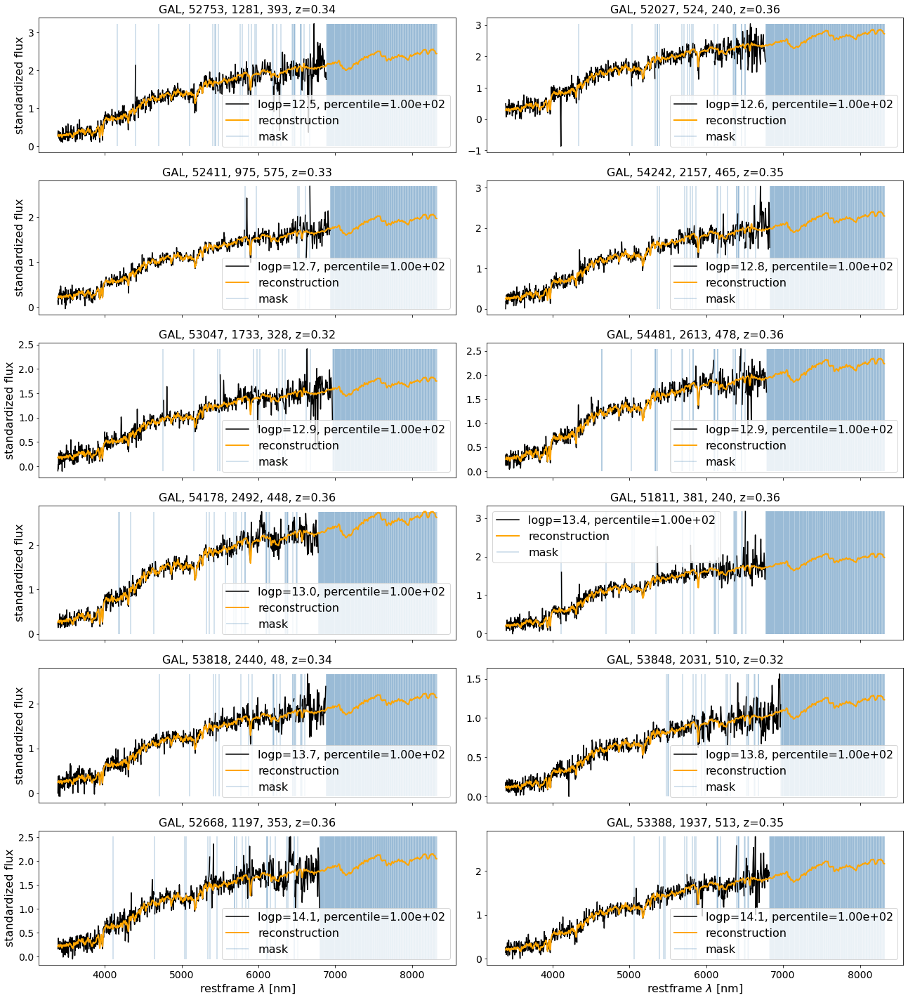

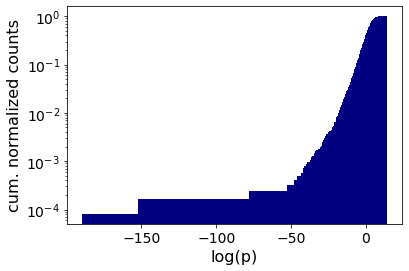

Anomalous Spectra valid 0


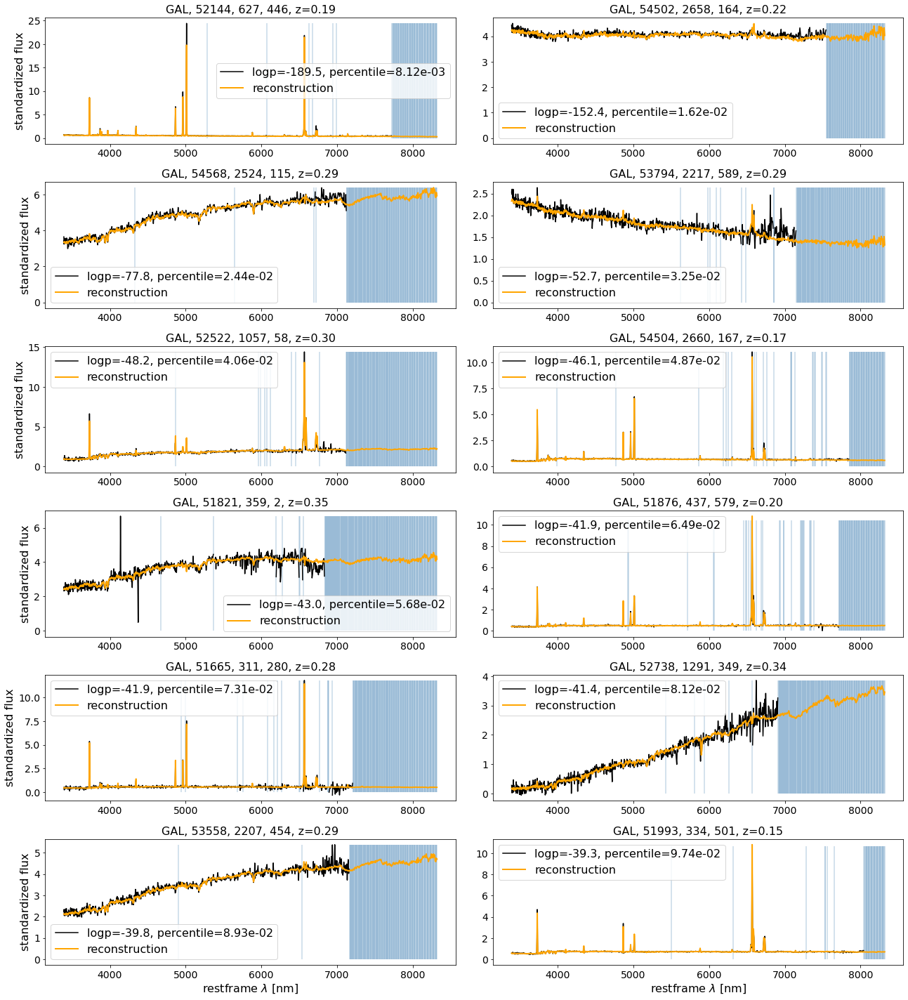

Most normal Spectra valid 0


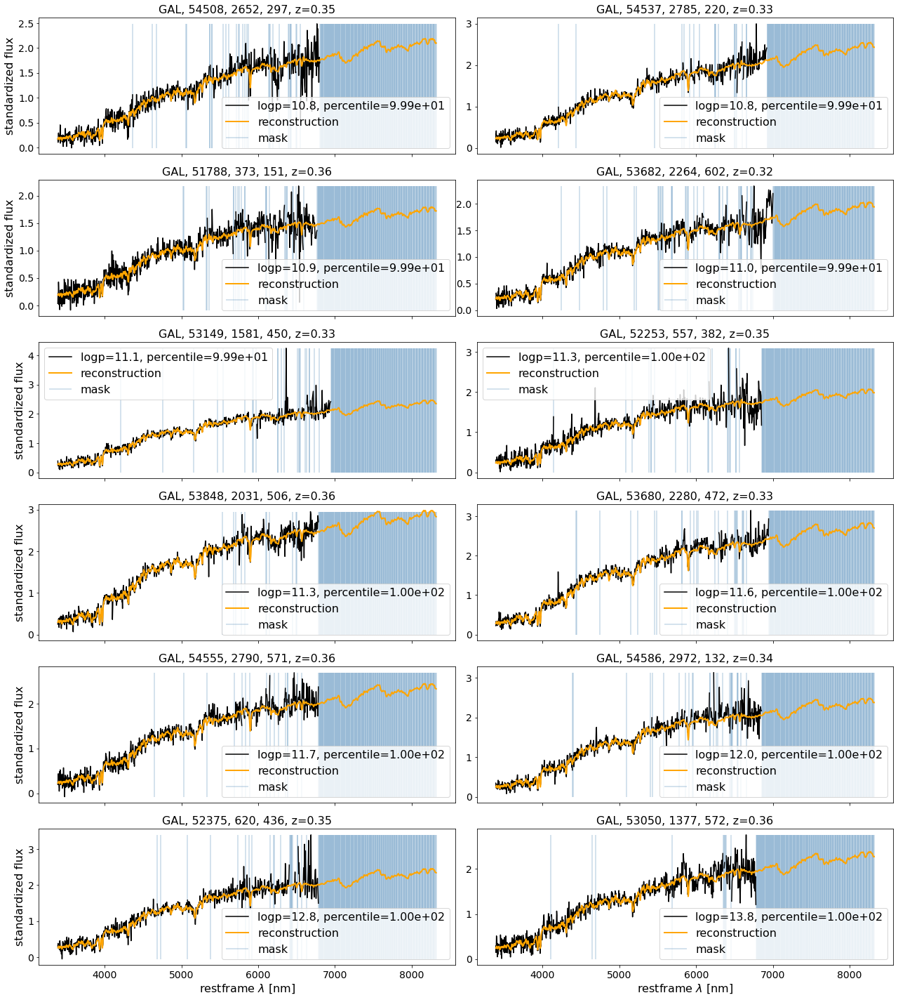

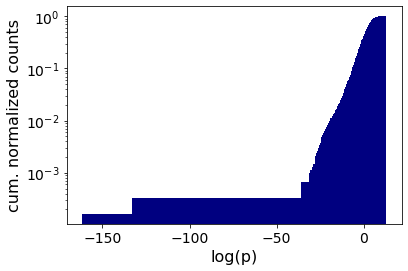

Anomalous Spectra test 0


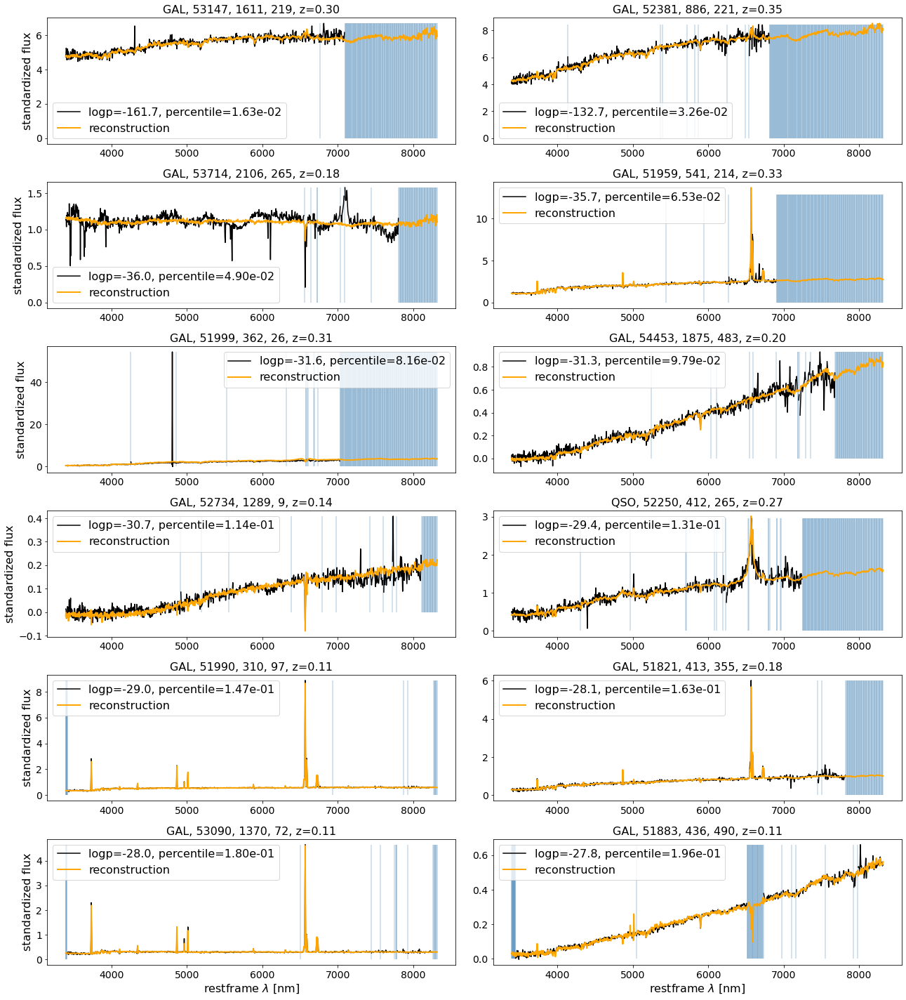

Most normal Spectra test 0


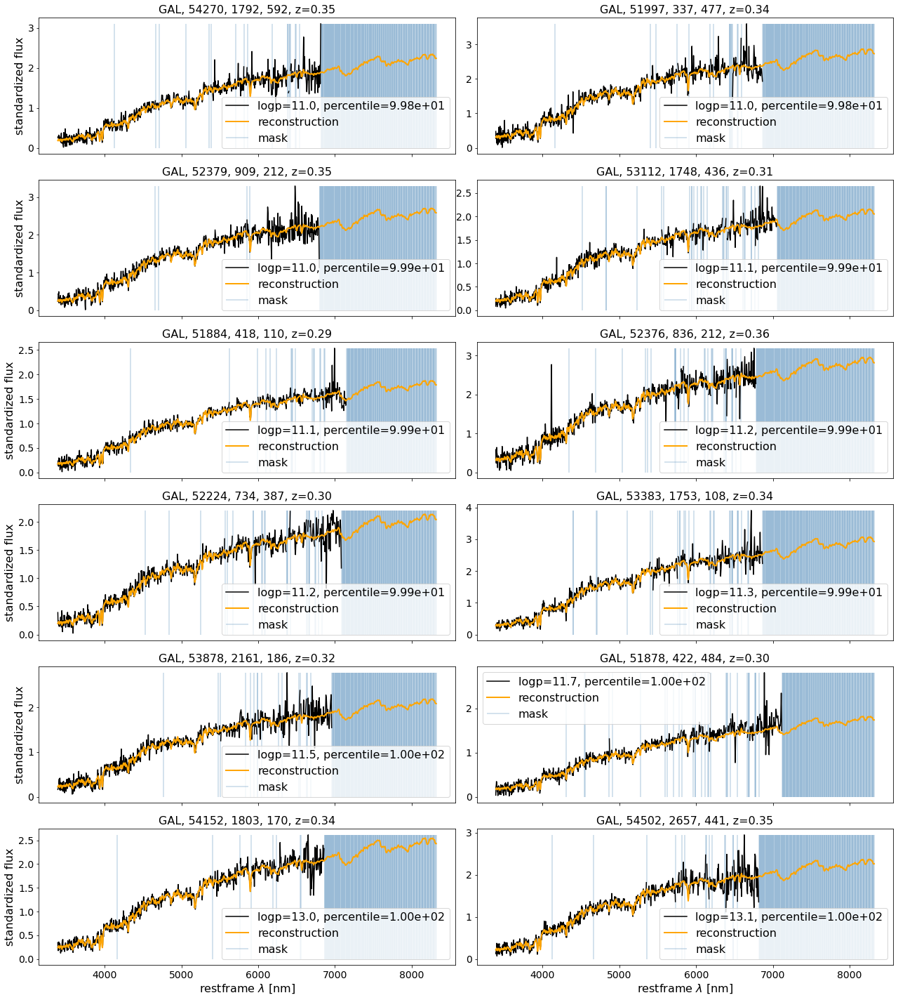

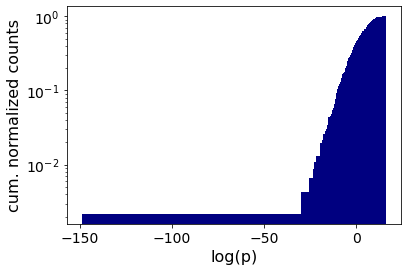

Anomalous Spectra train 1


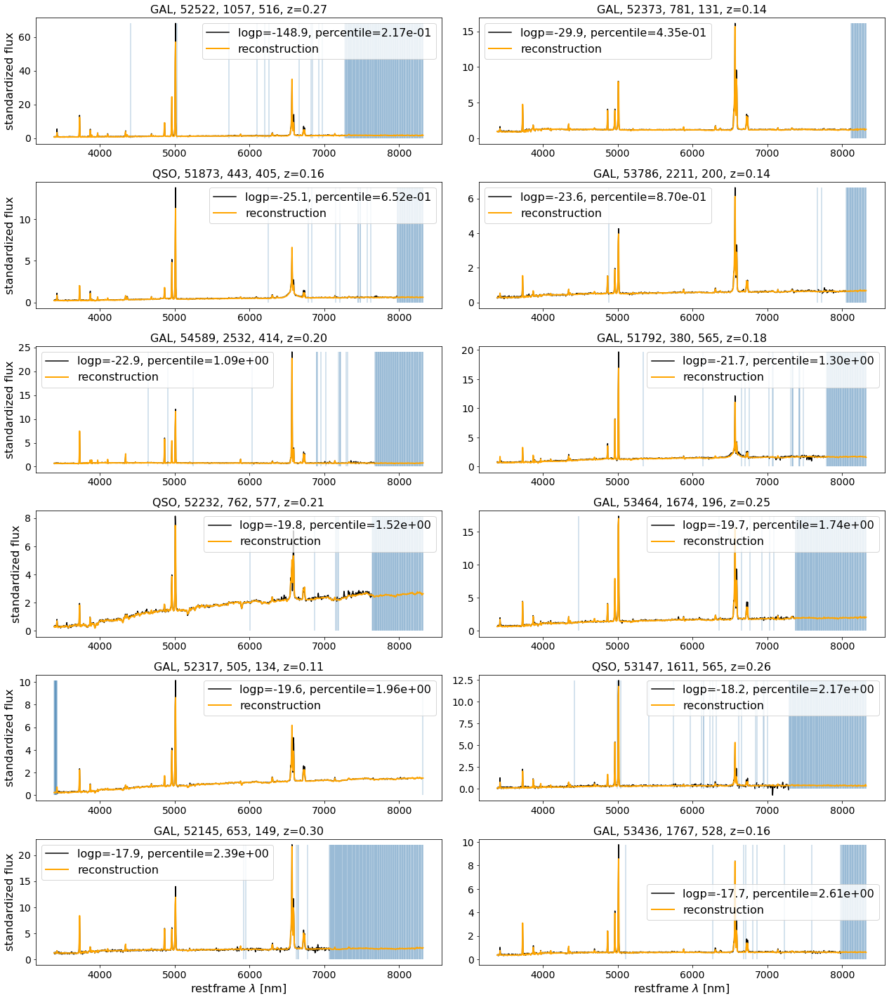

Most normal Spectra train 1


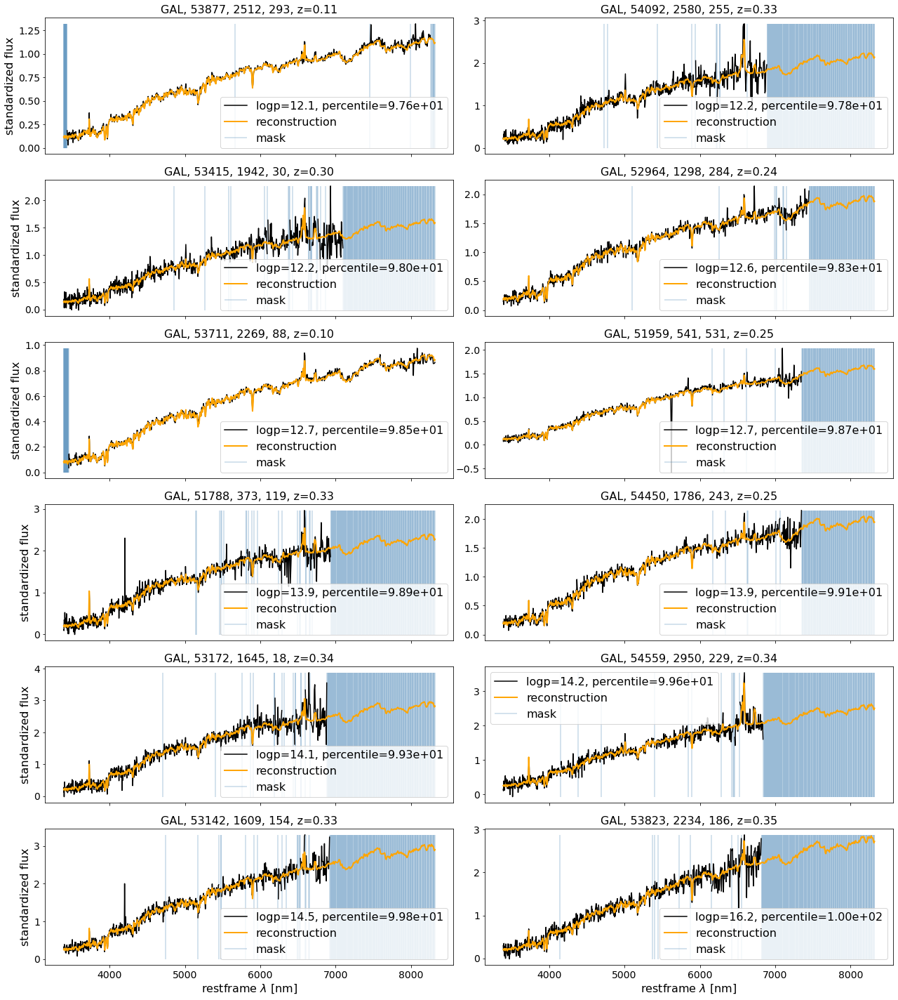

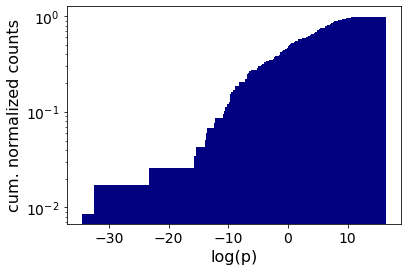

Anomalous Spectra valid 1


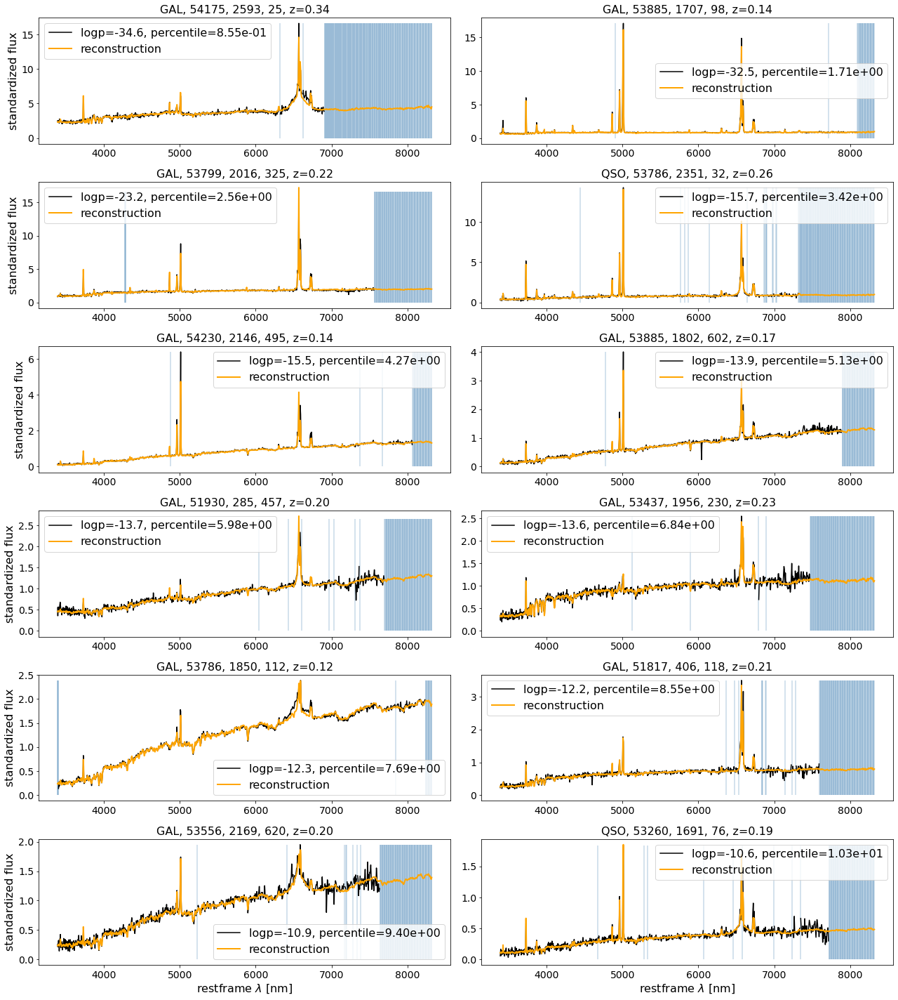

Most normal Spectra valid 1


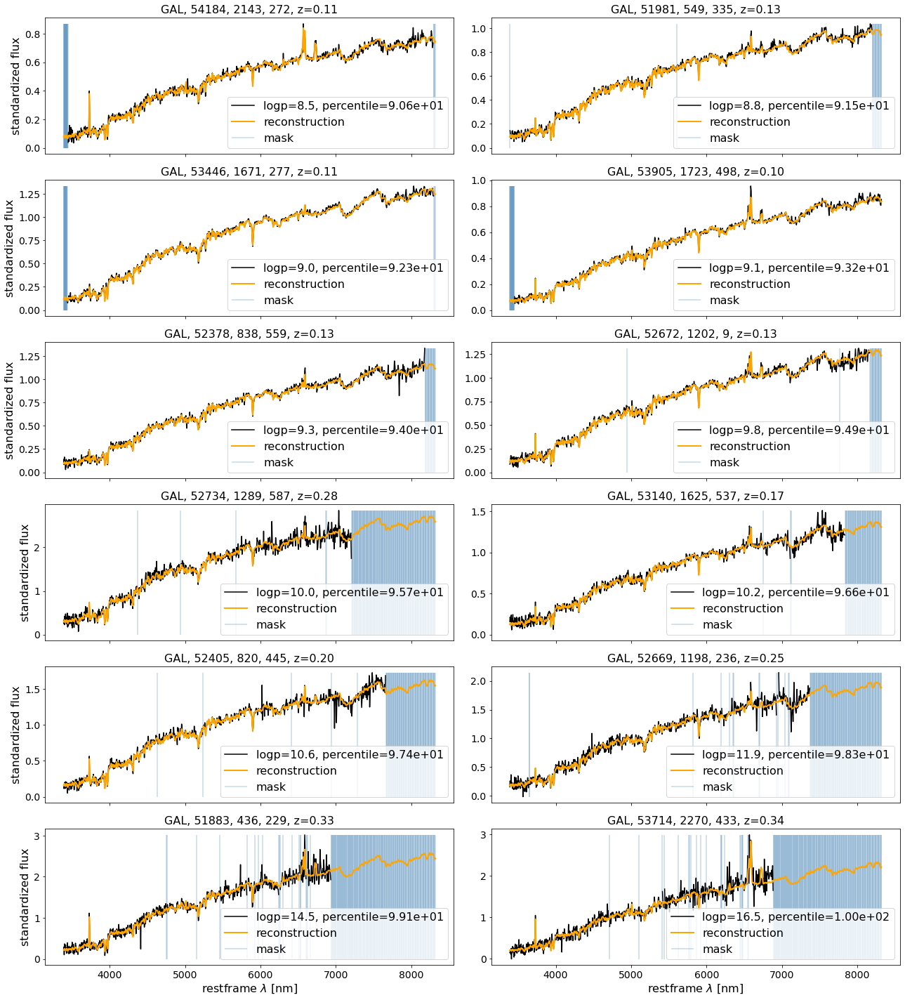

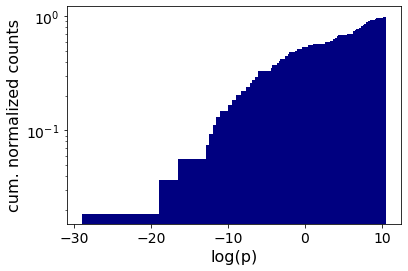

Anomalous Spectra test 1


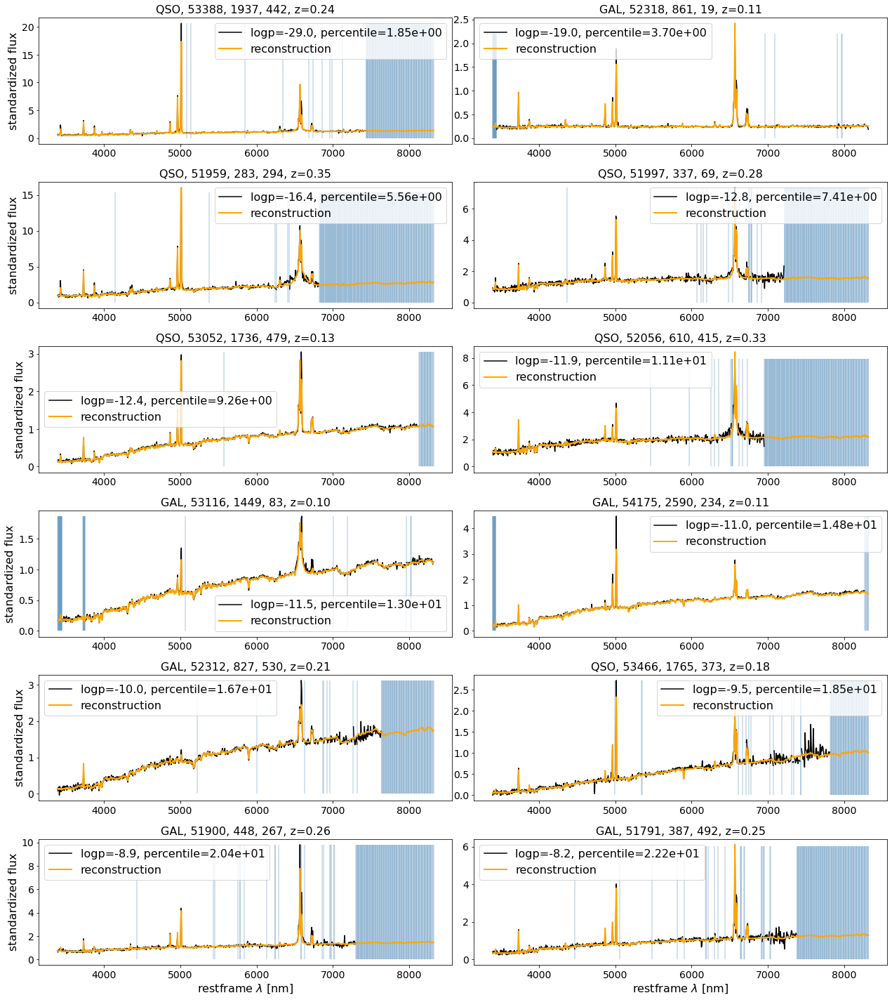

Most normal Spectra test 1


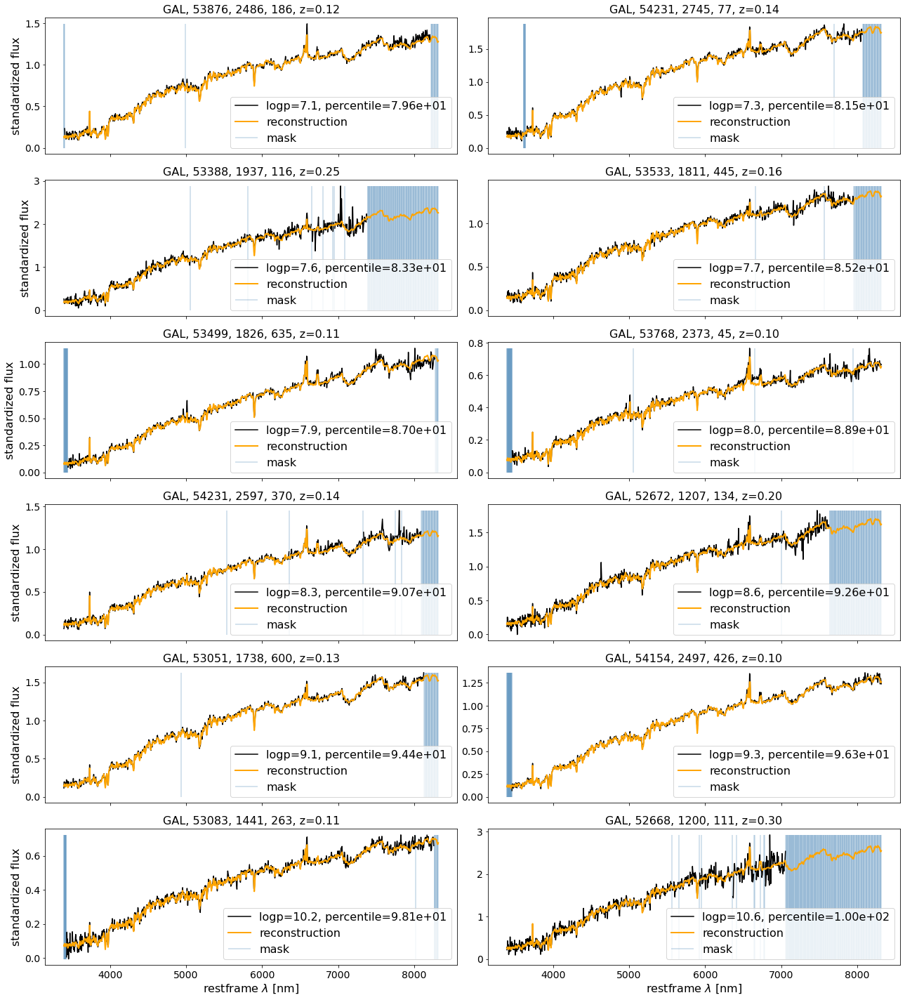

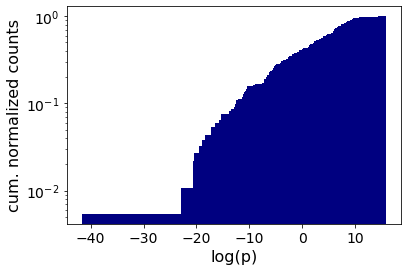

Anomalous Spectra train 2


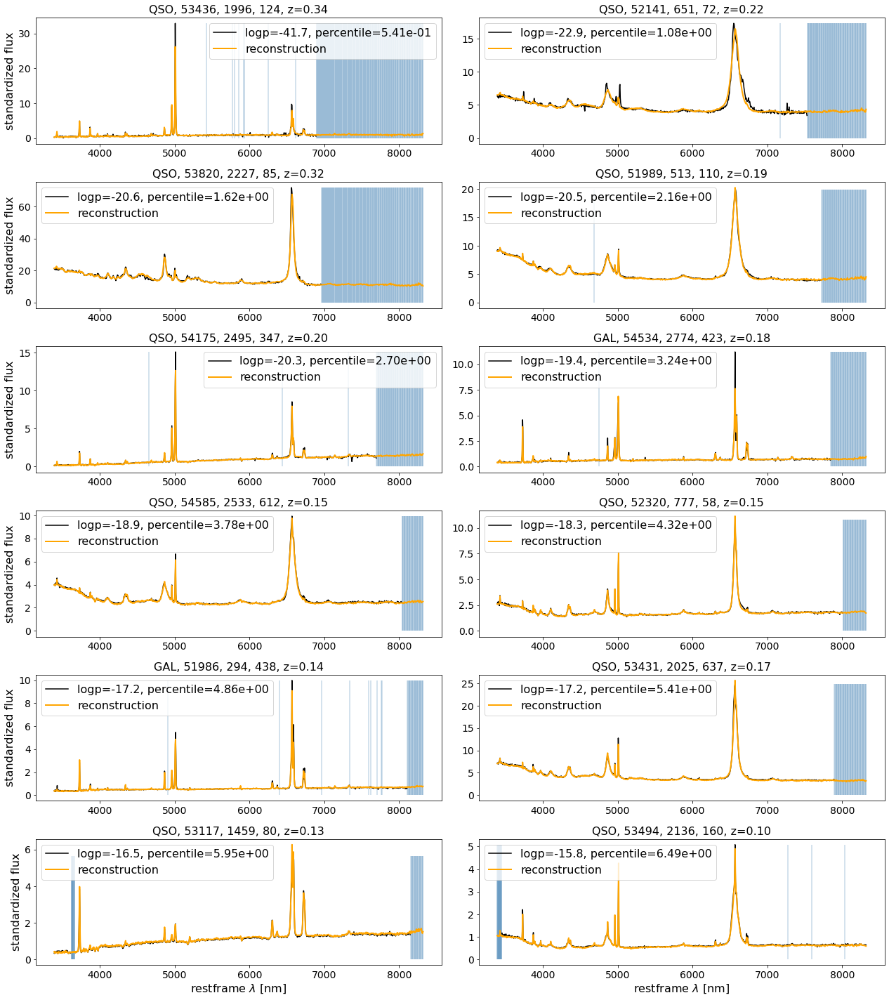

Most normal Spectra train 2


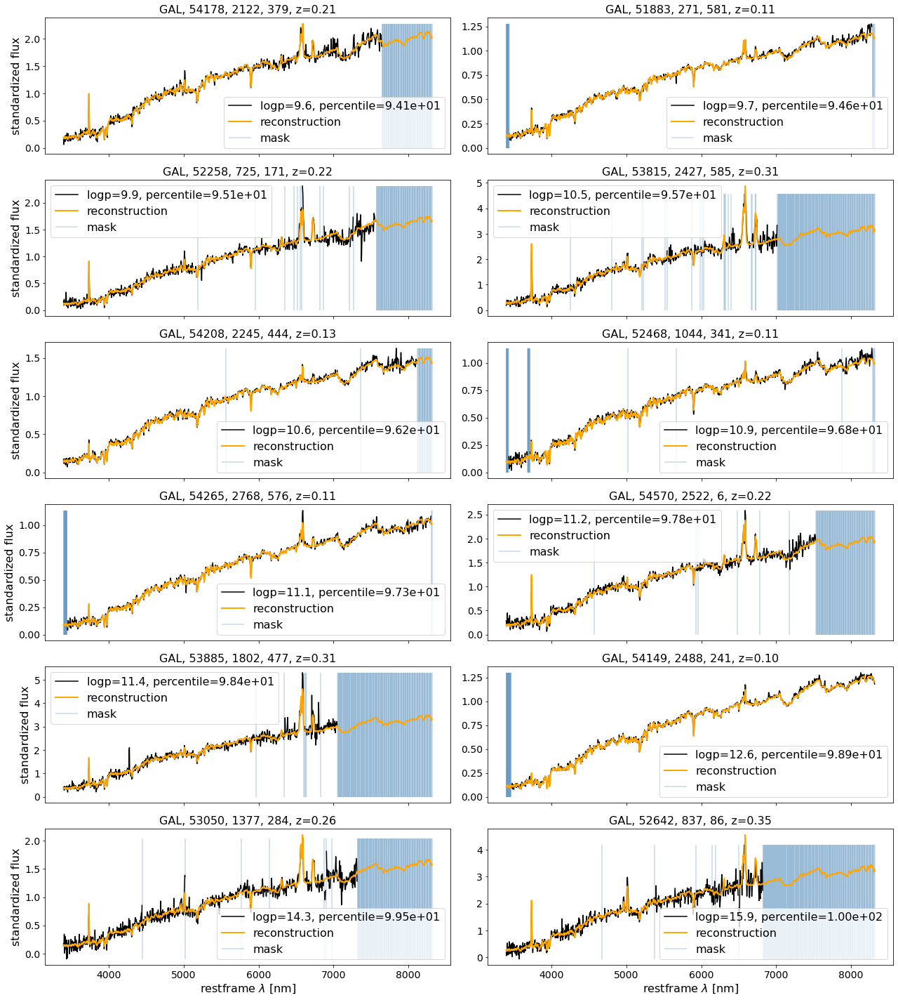

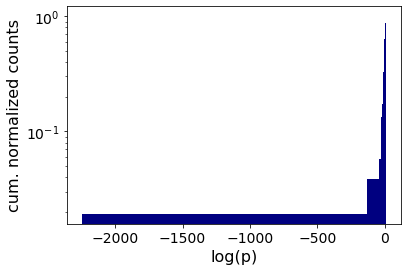

Anomalous Spectra valid 2


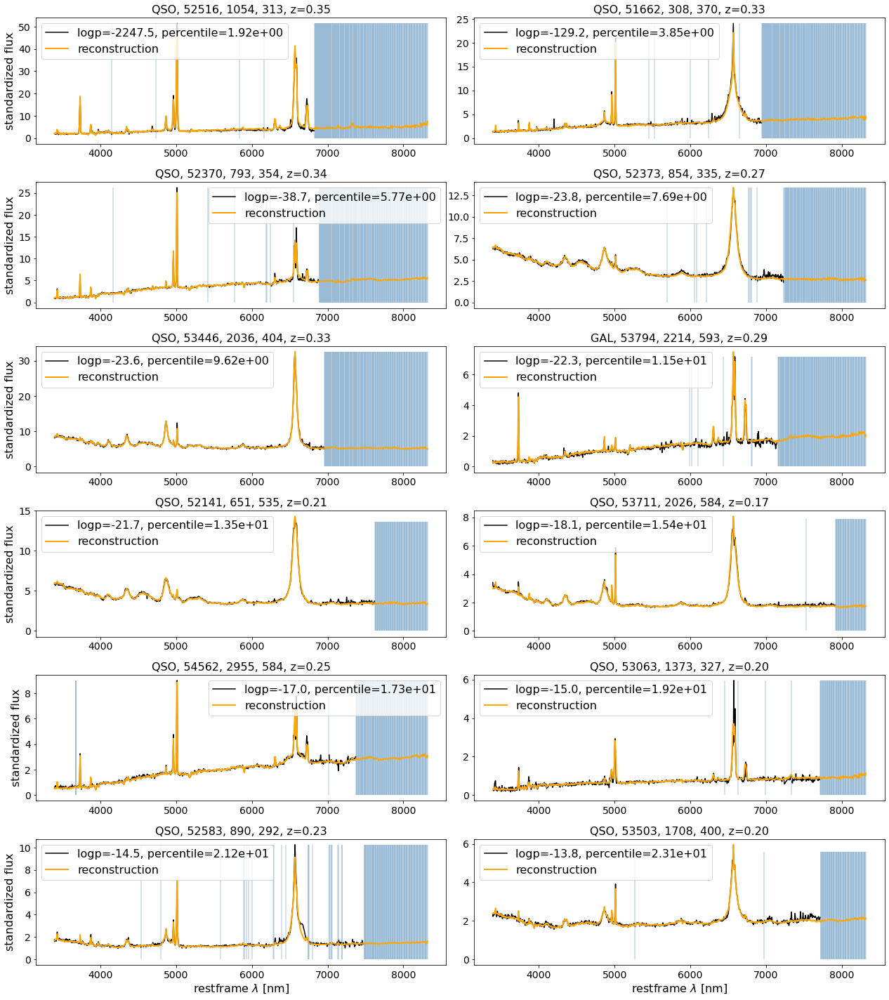

Most normal Spectra valid 2


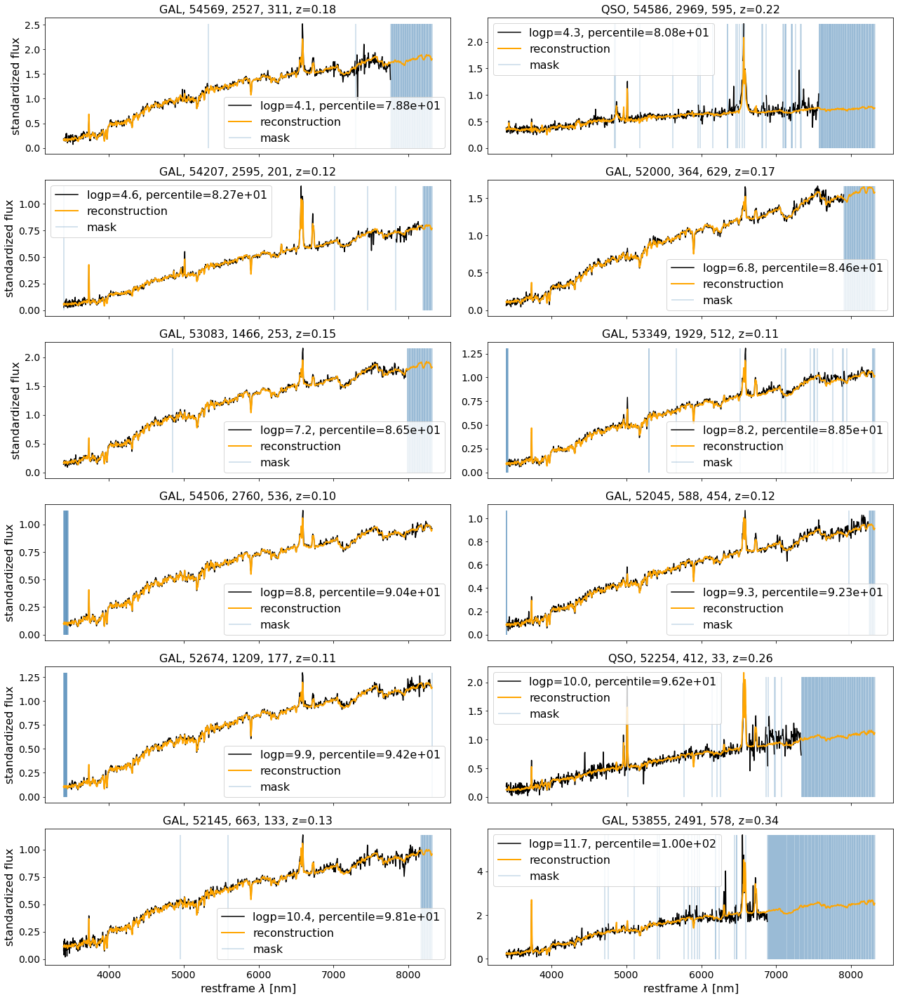

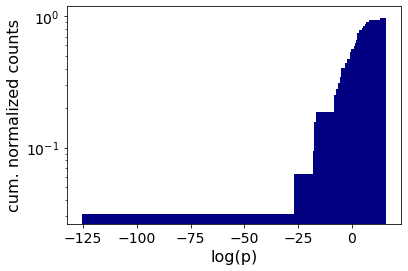

Anomalous Spectra test 2


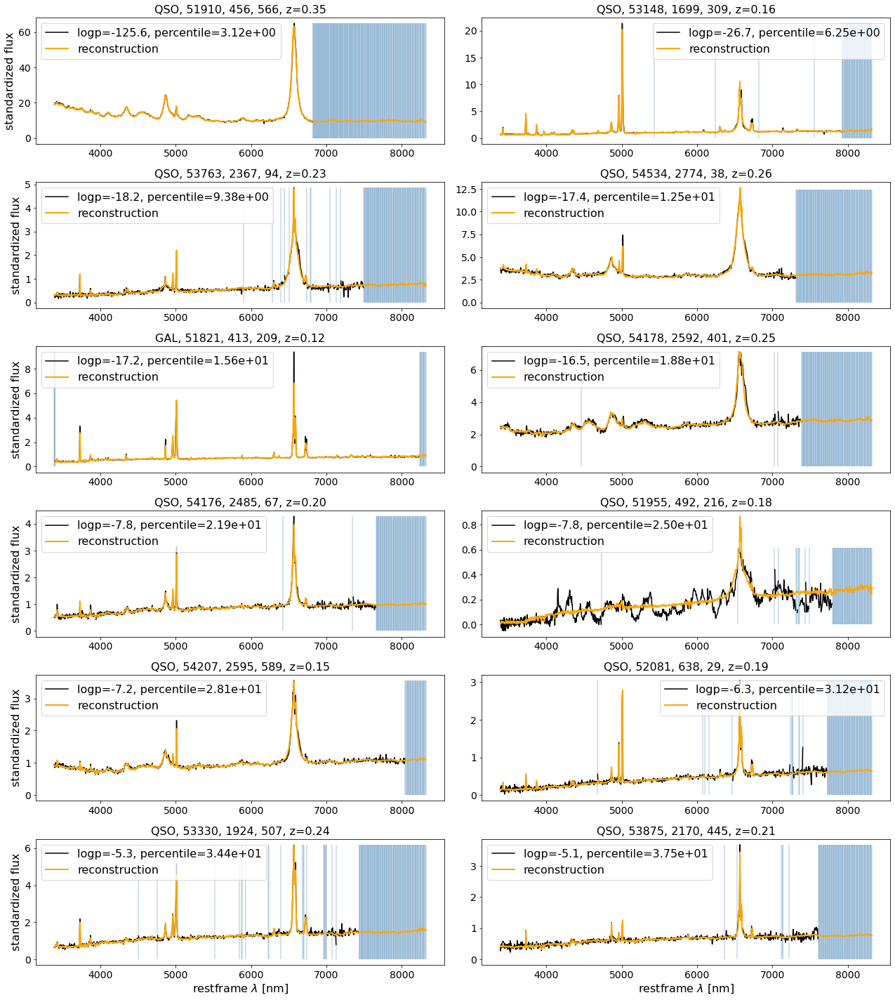

Most normal Spectra test 2


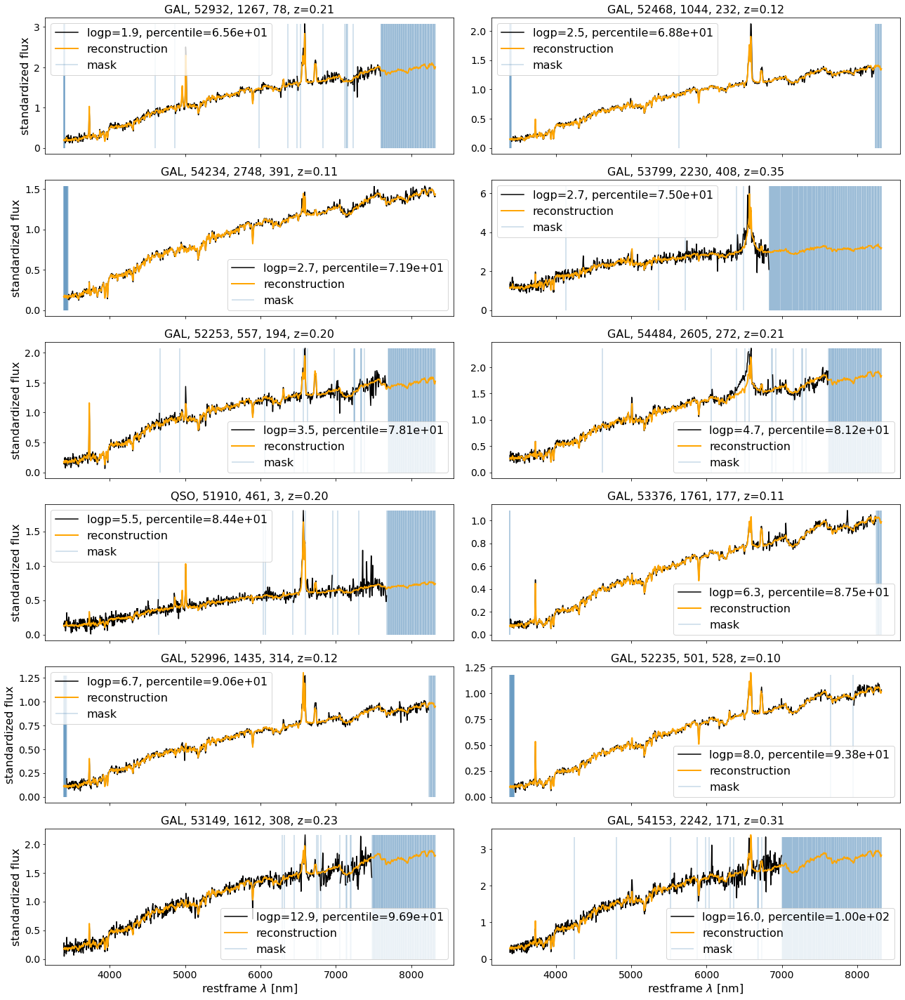

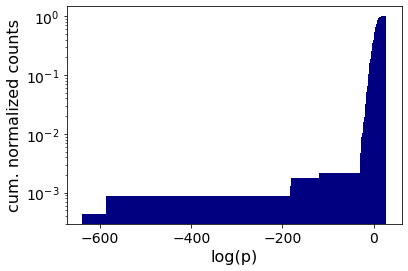

Anomalous Spectra train 3


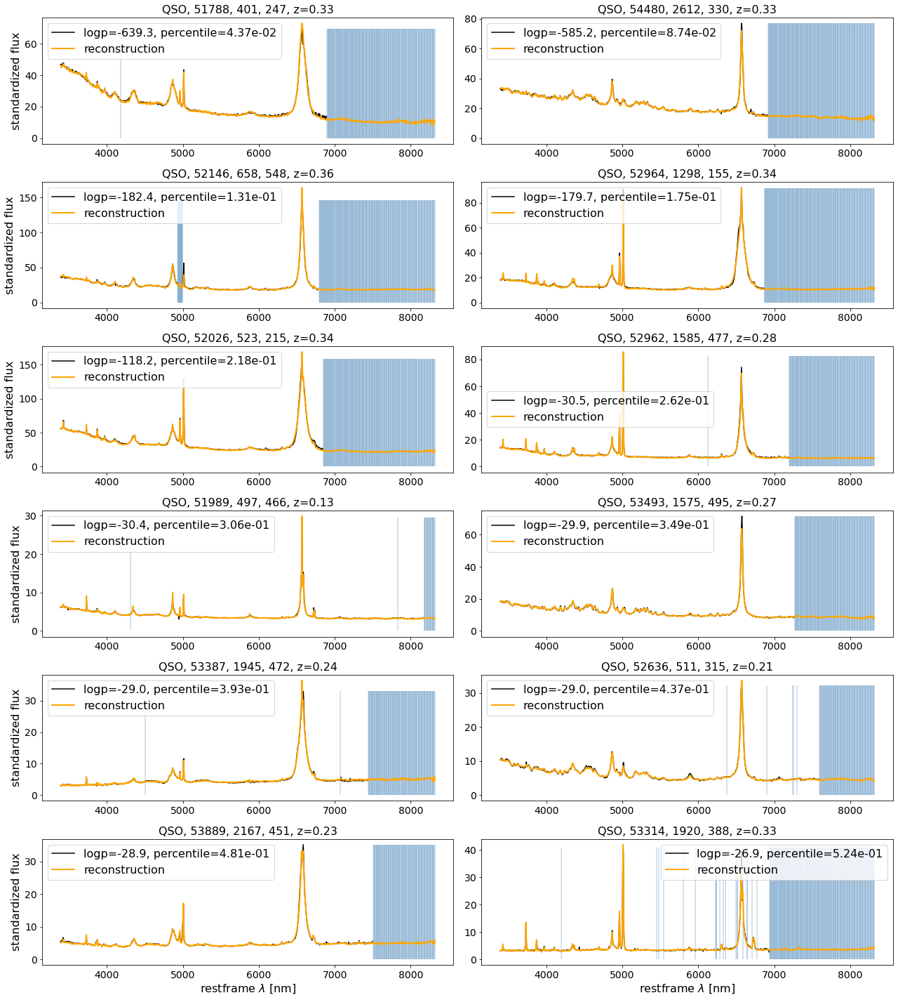

Most normal Spectra train 3


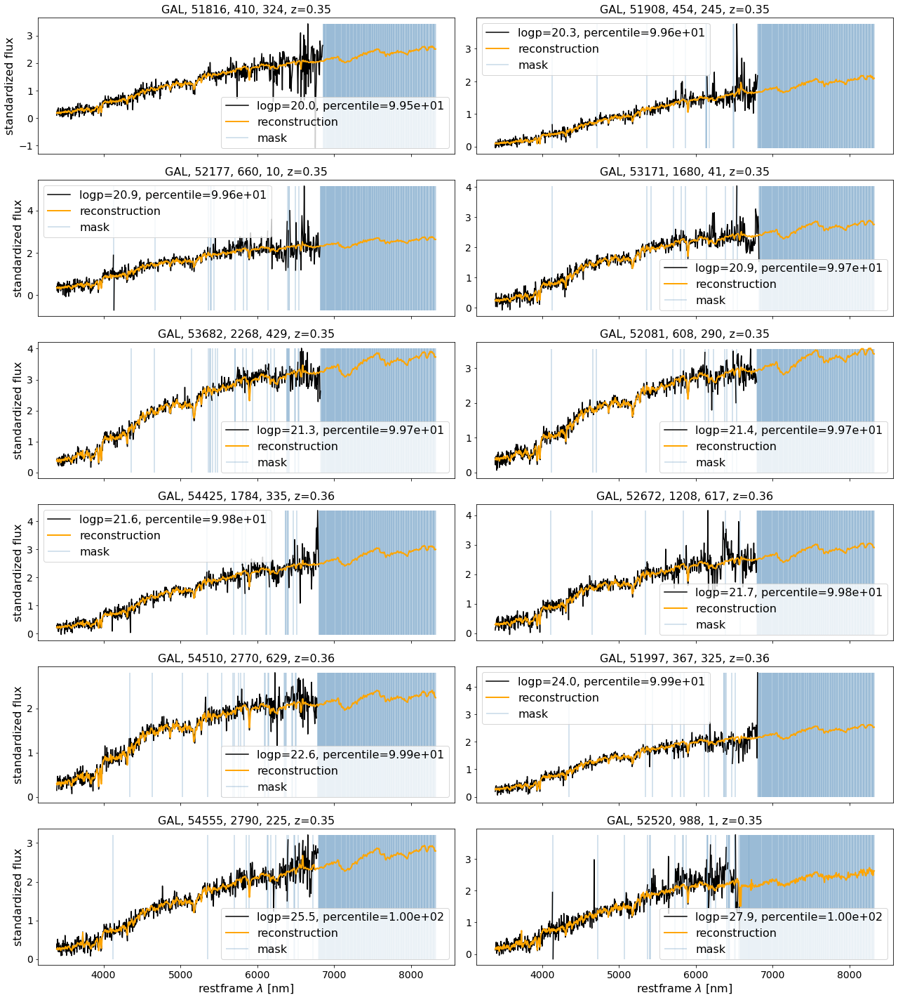

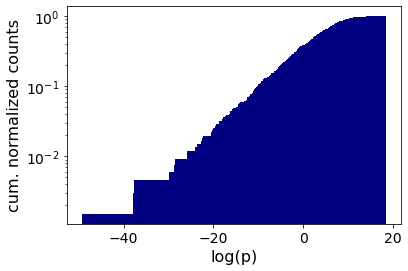

Anomalous Spectra valid 3


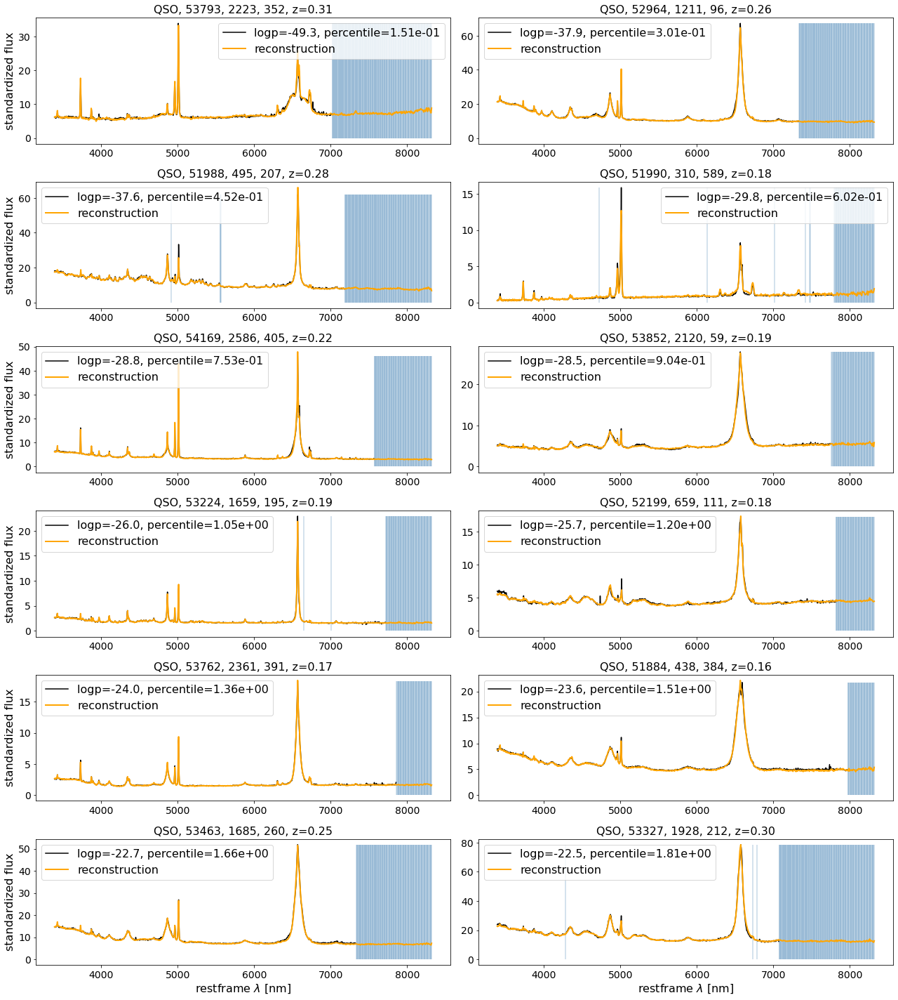

Most normal Spectra valid 3


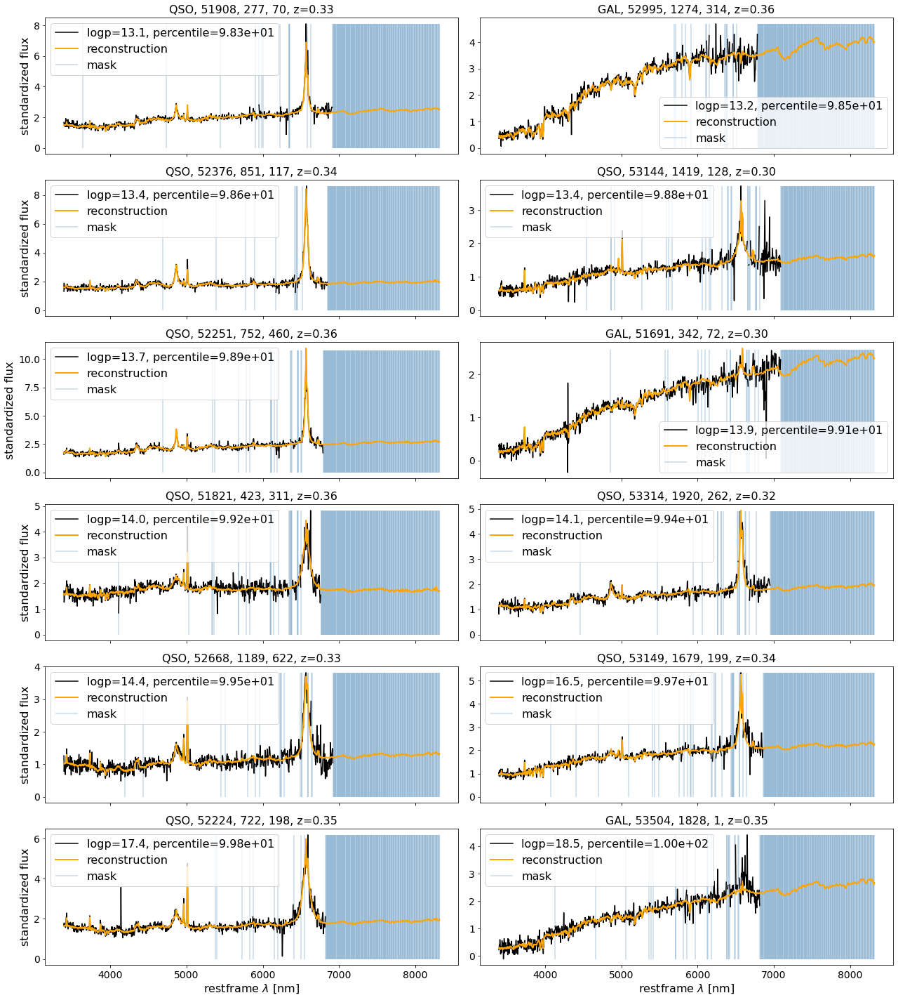

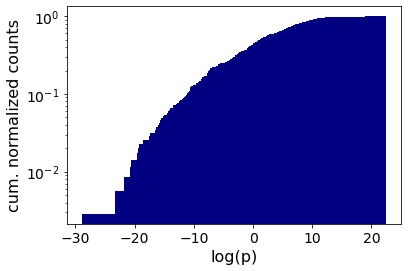

Anomalous Spectra test 3


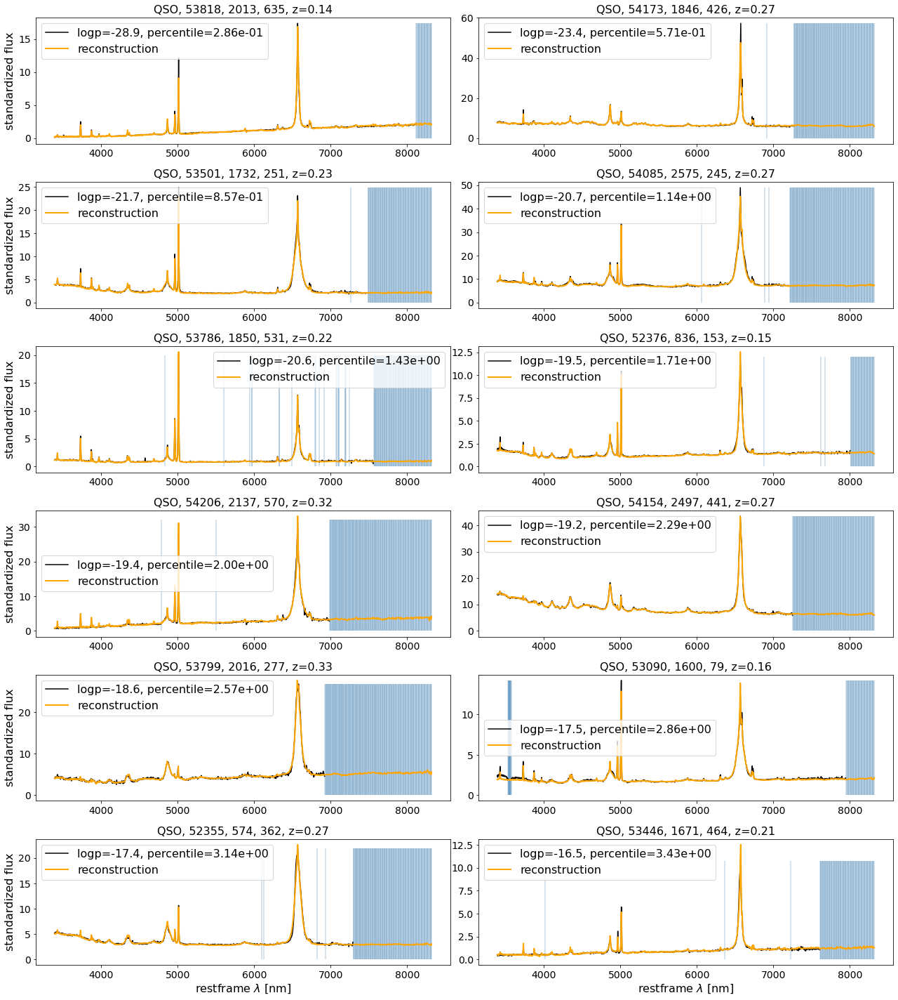

Most normal Spectra test 3


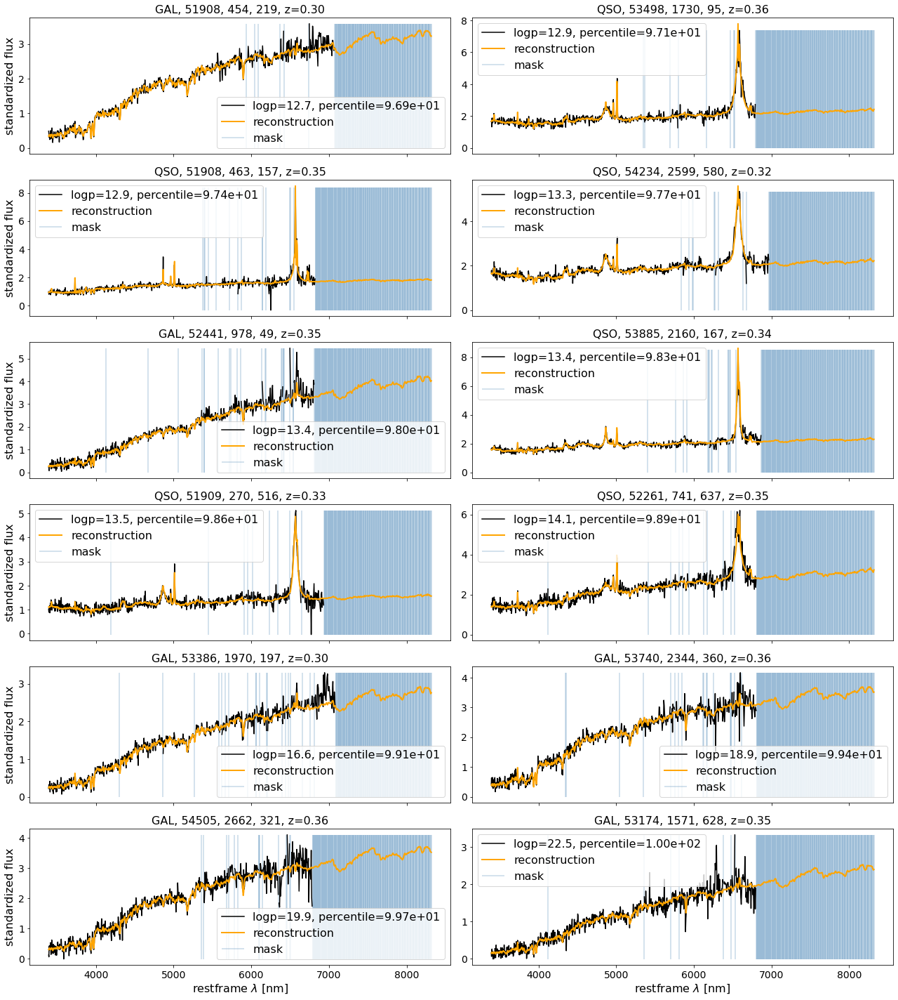

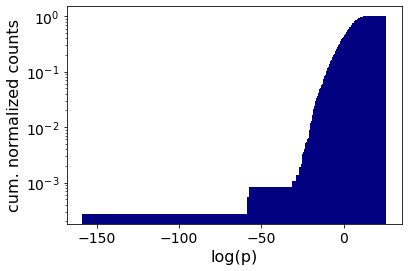

Anomalous Spectra train 4


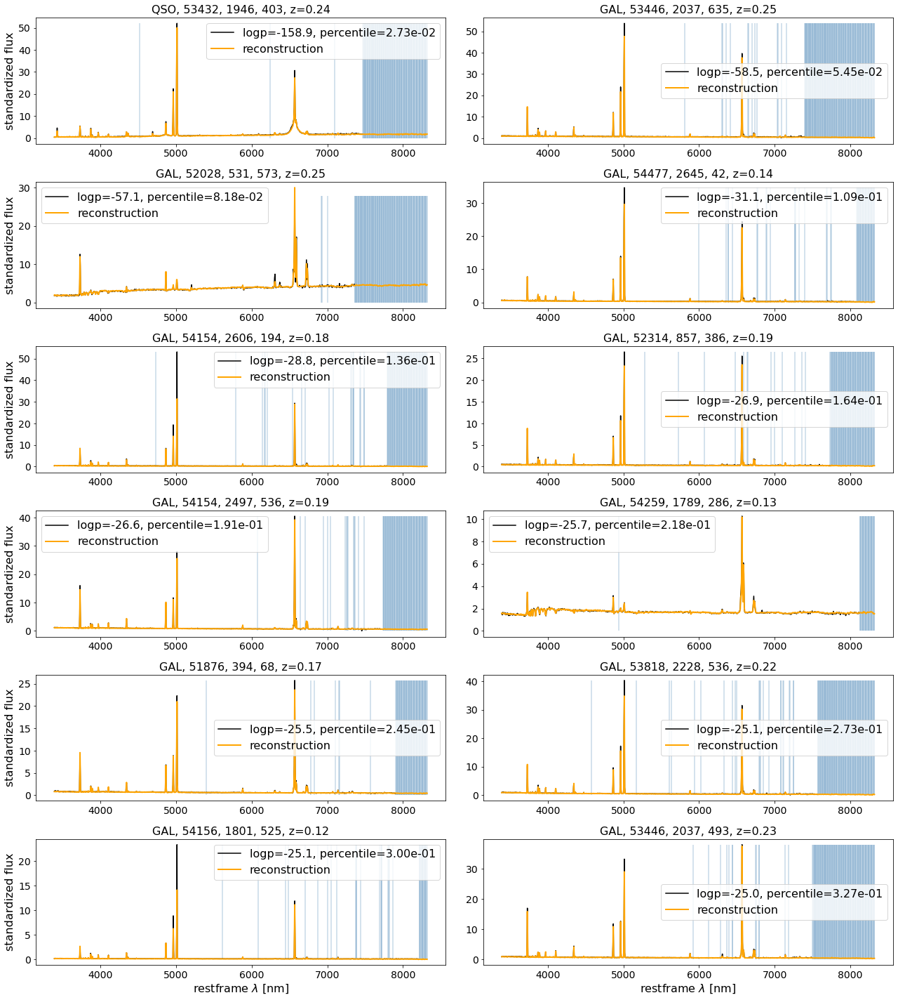

Most normal Spectra train 4


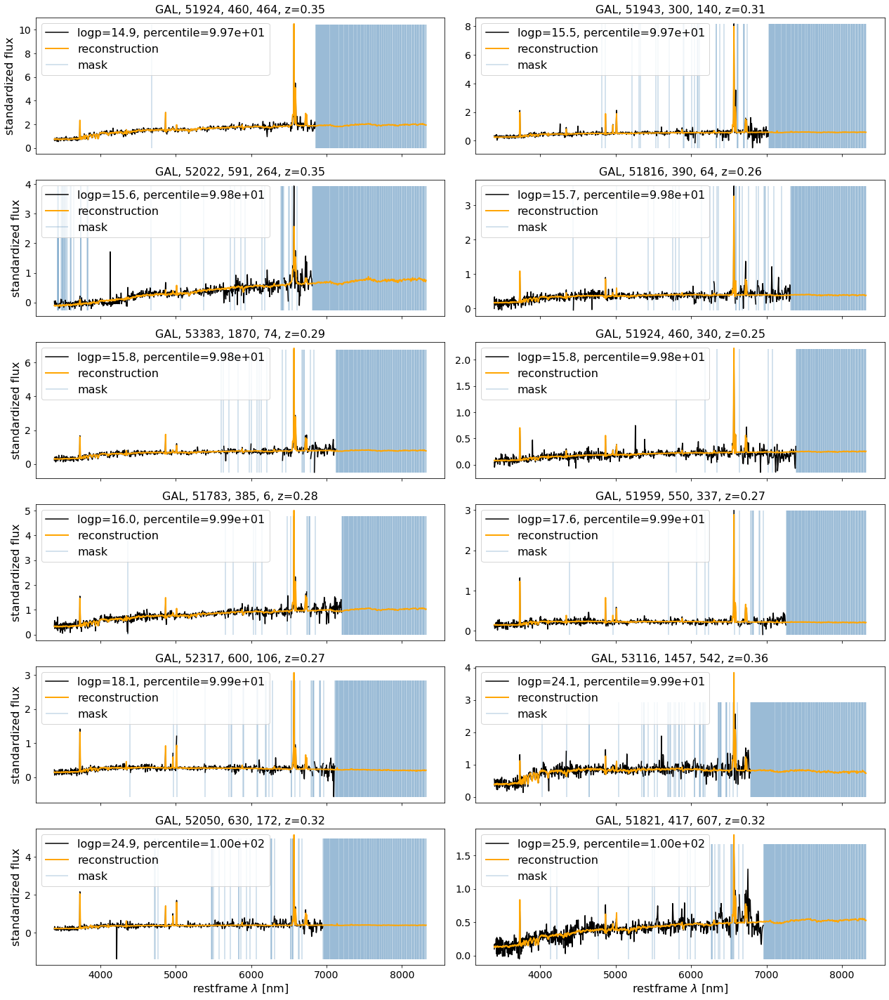

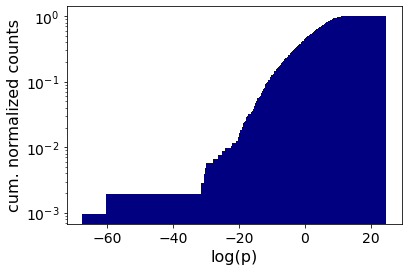

Anomalous Spectra valid 4


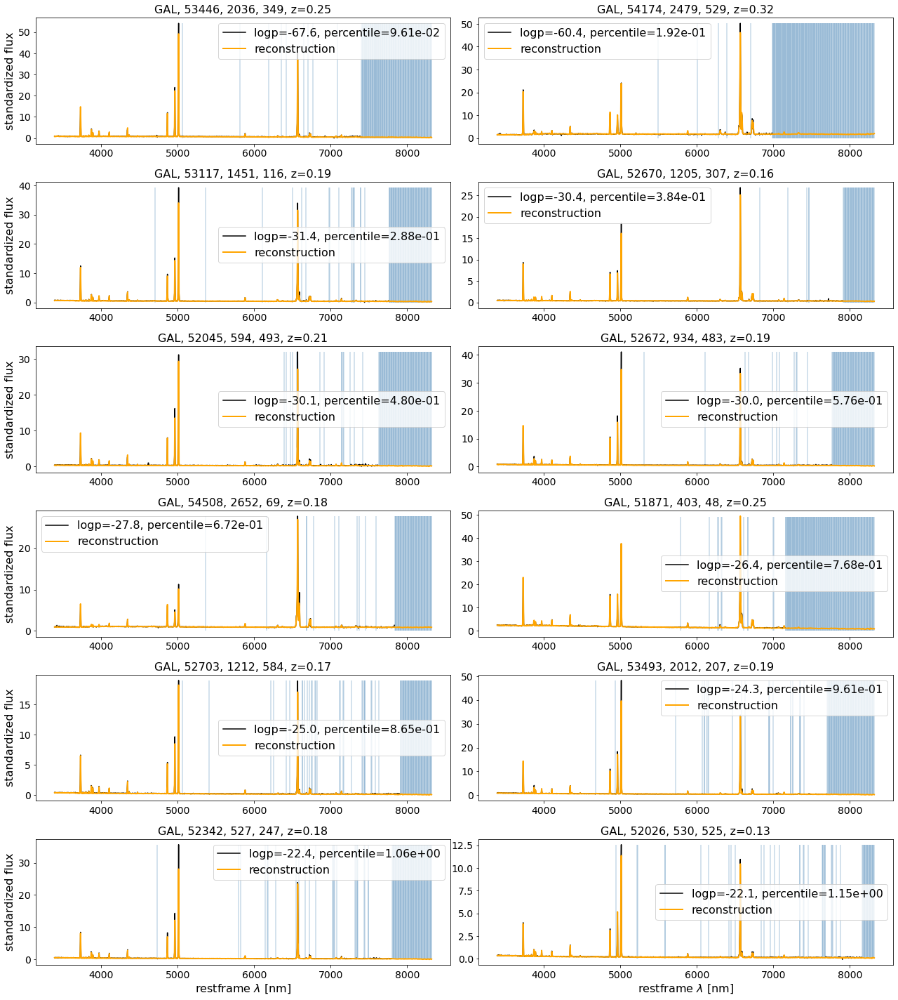

Most normal Spectra valid 4


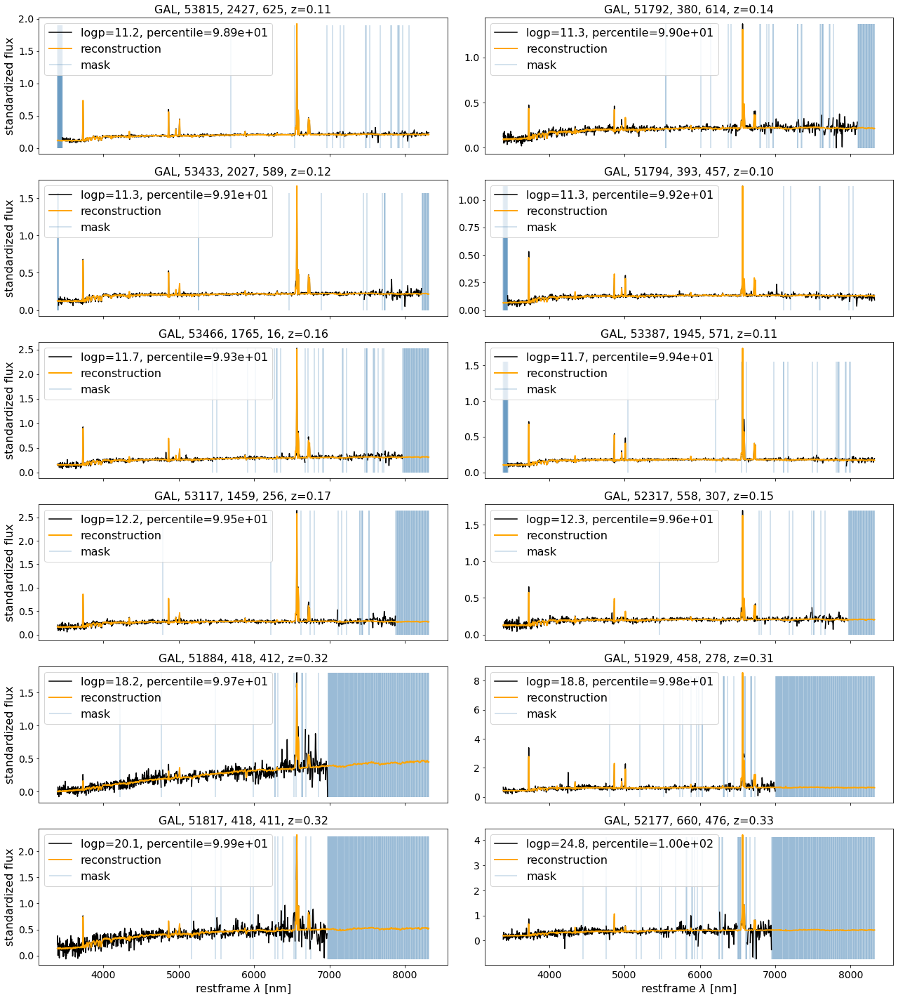

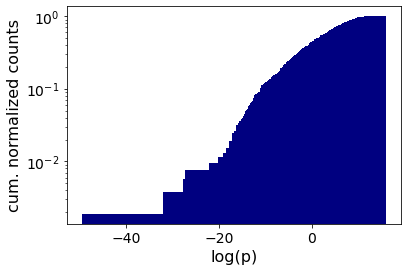

Anomalous Spectra test 4


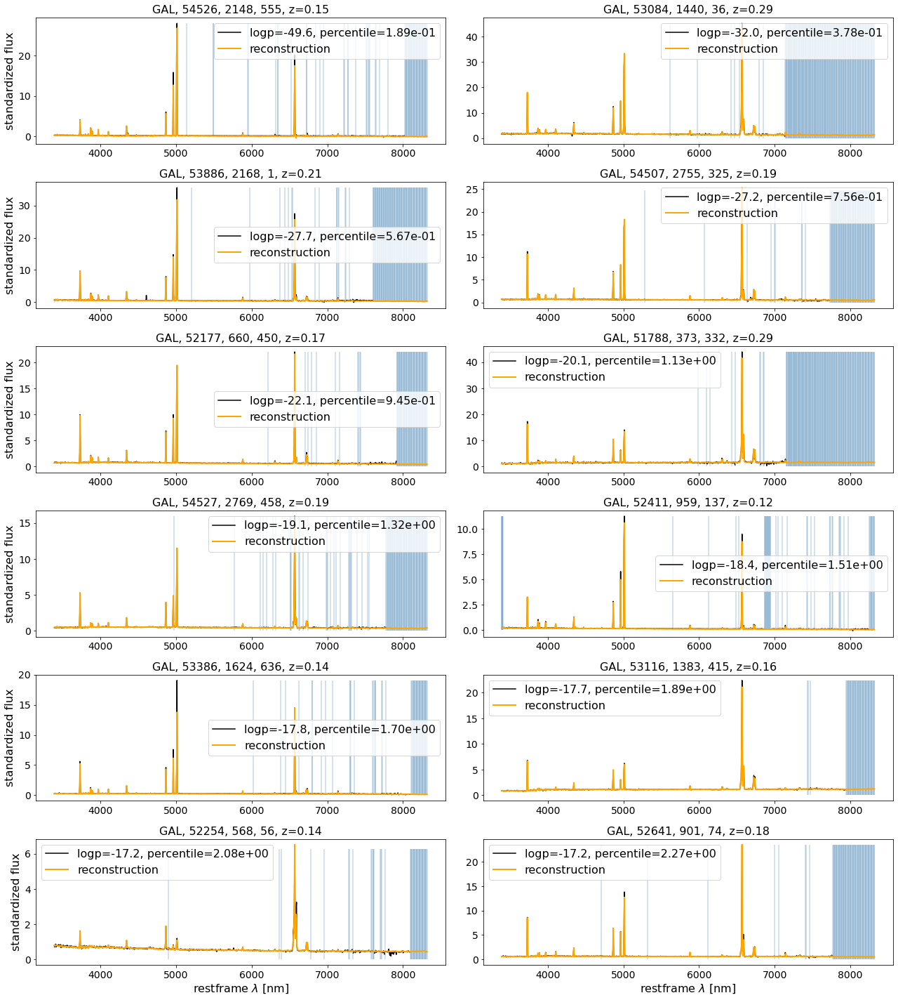

Most normal Spectra test 4


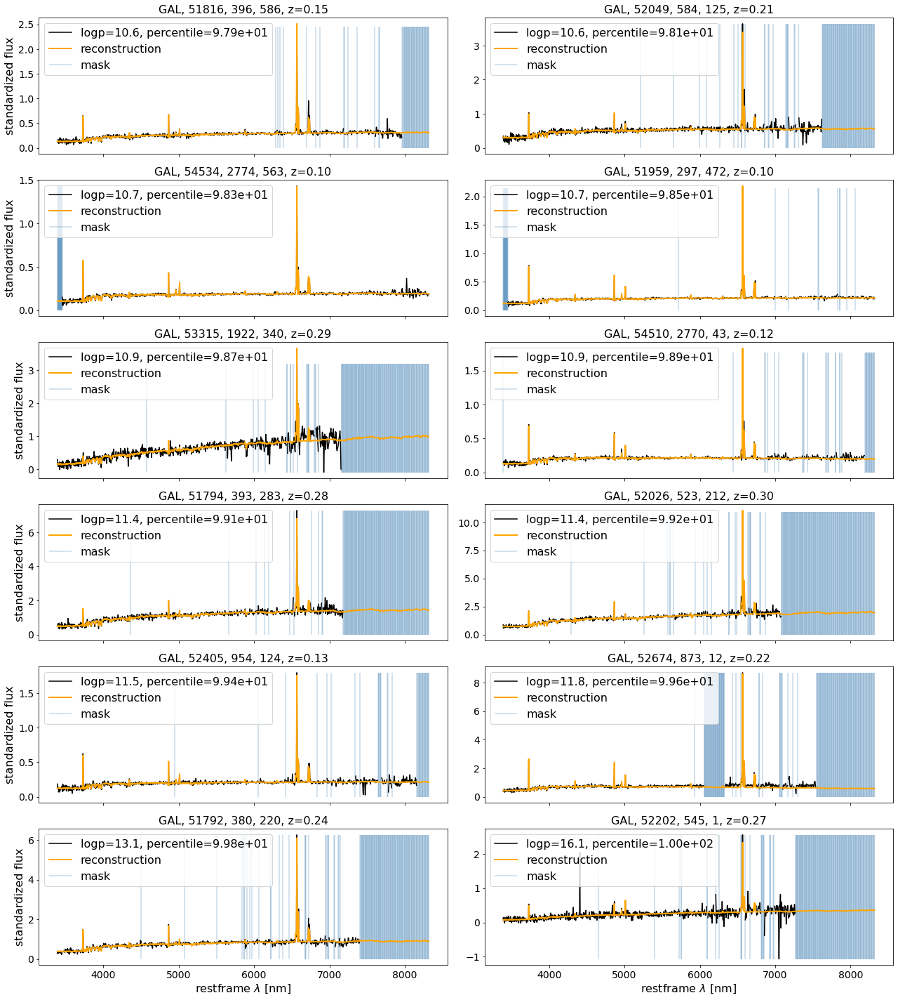

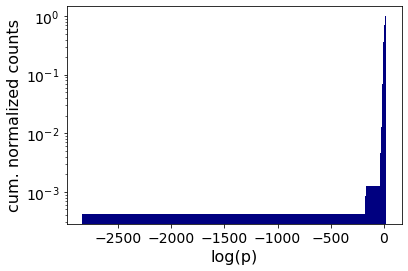

Anomalous Spectra train 5


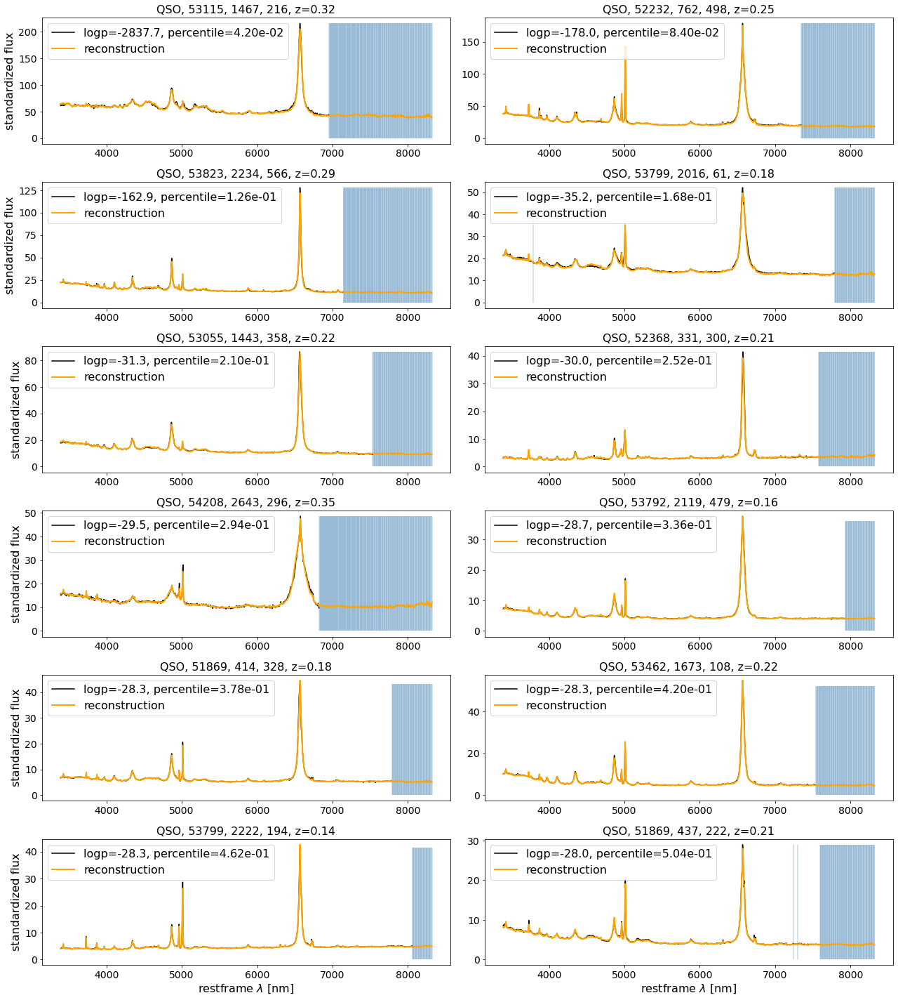

Most normal Spectra train 5


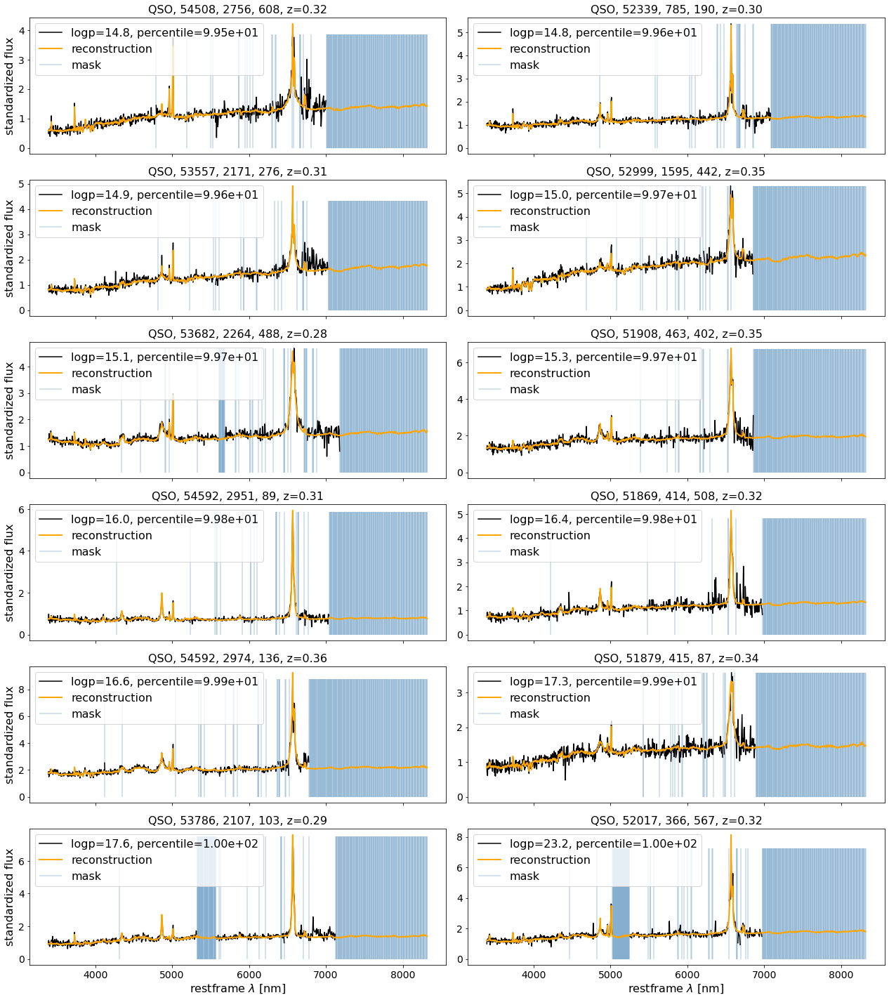

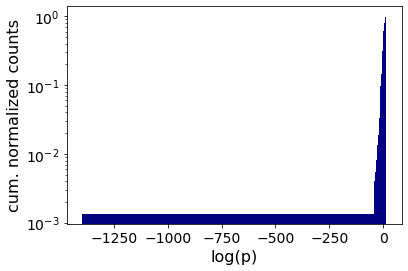

Anomalous Spectra valid 5


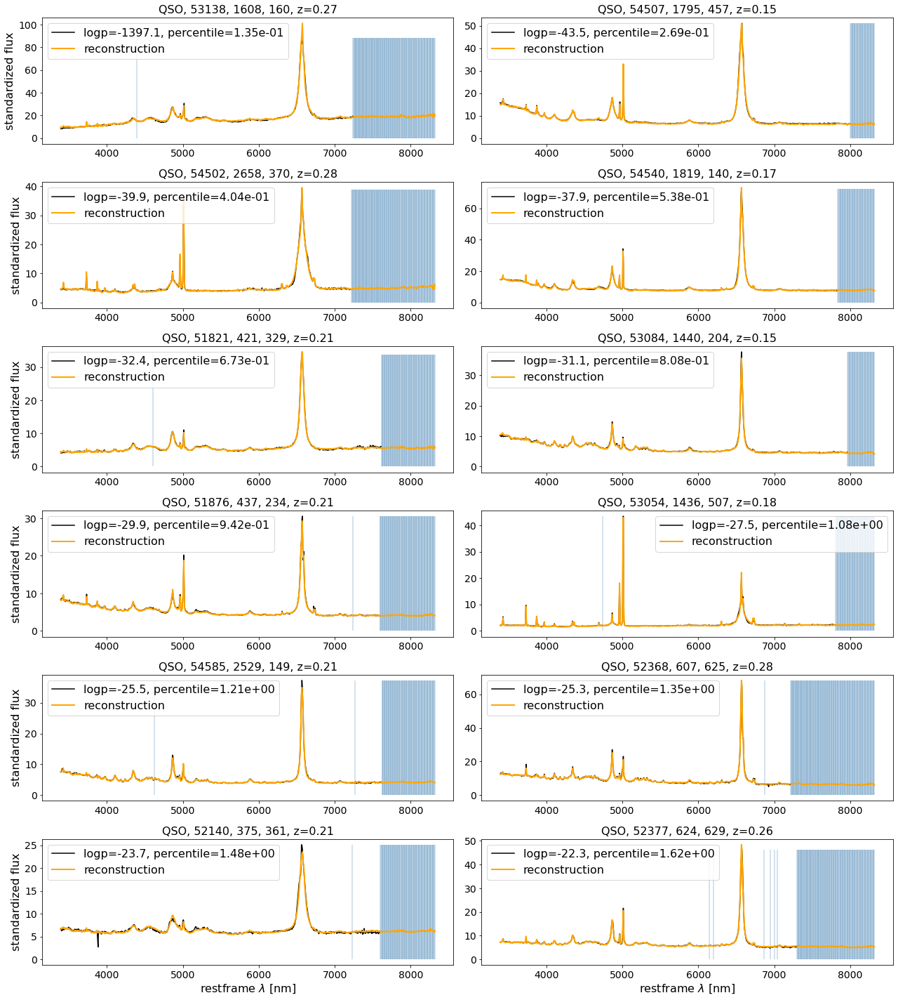

Most normal Spectra valid 5


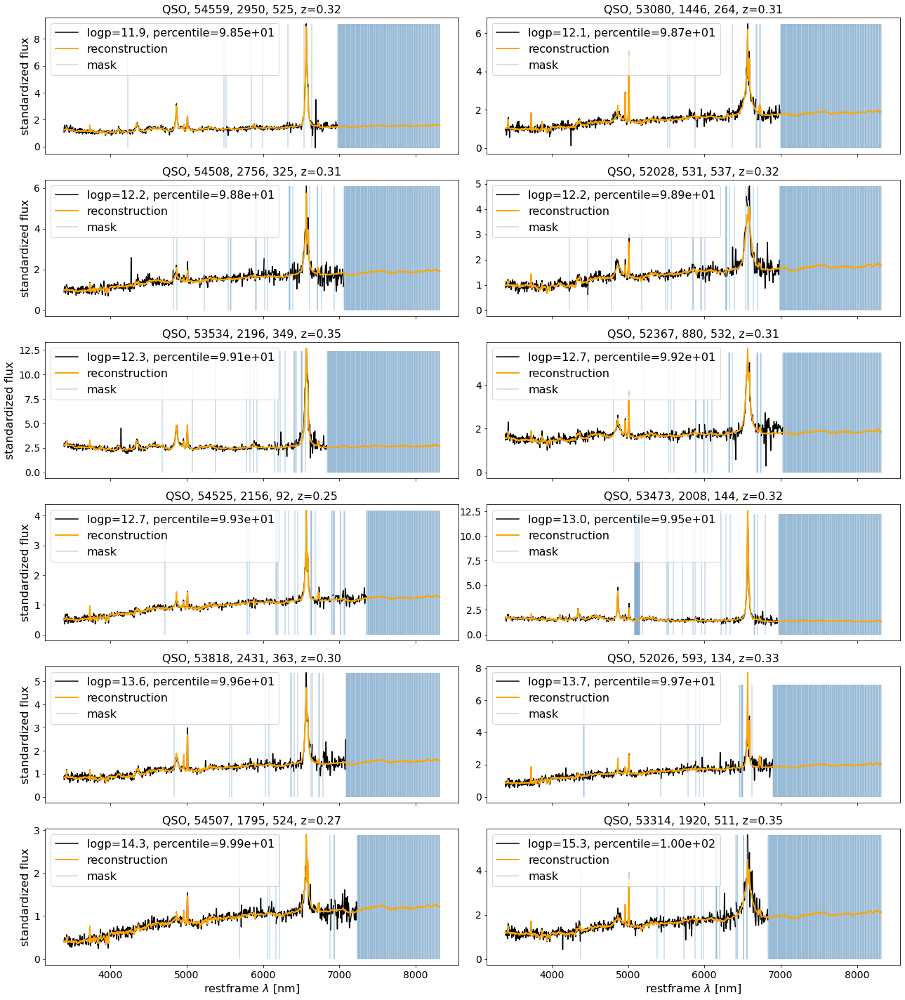

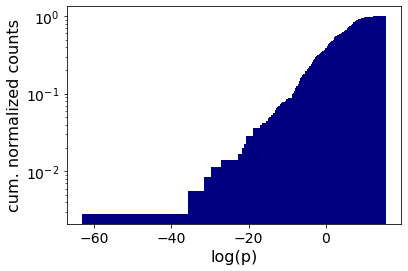

Anomalous Spectra test 5


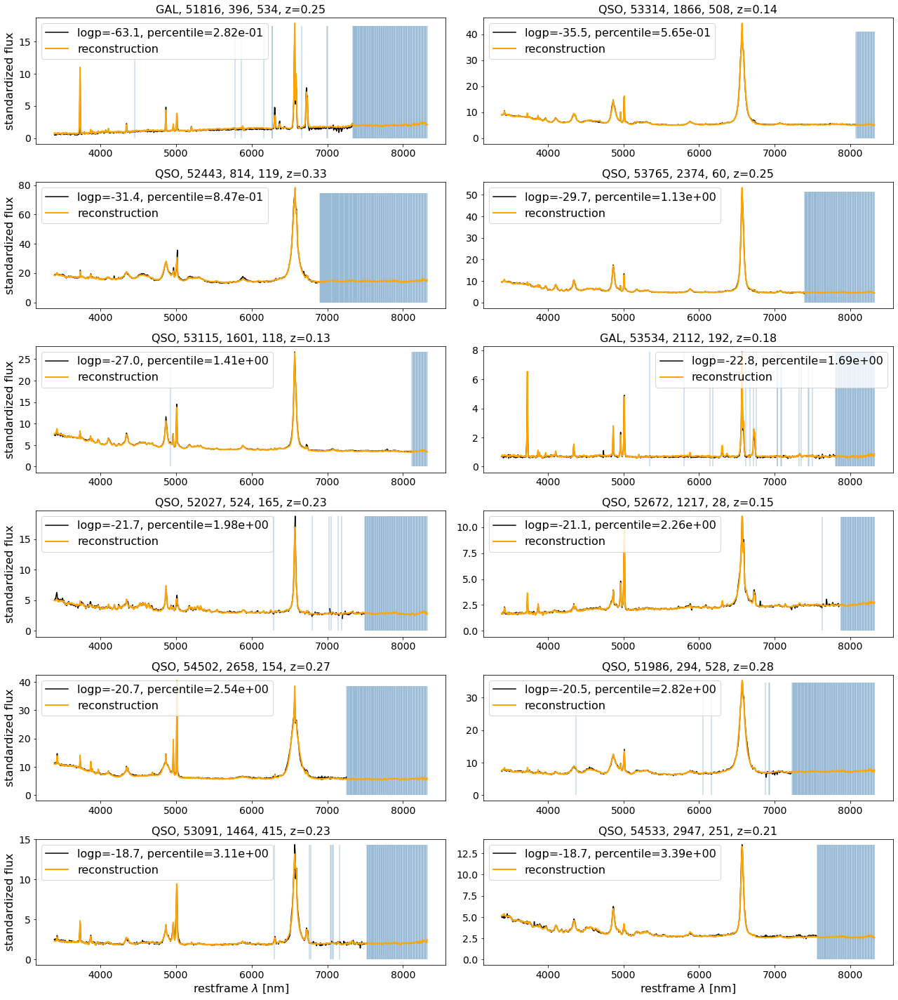

Most normal Spectra test 5


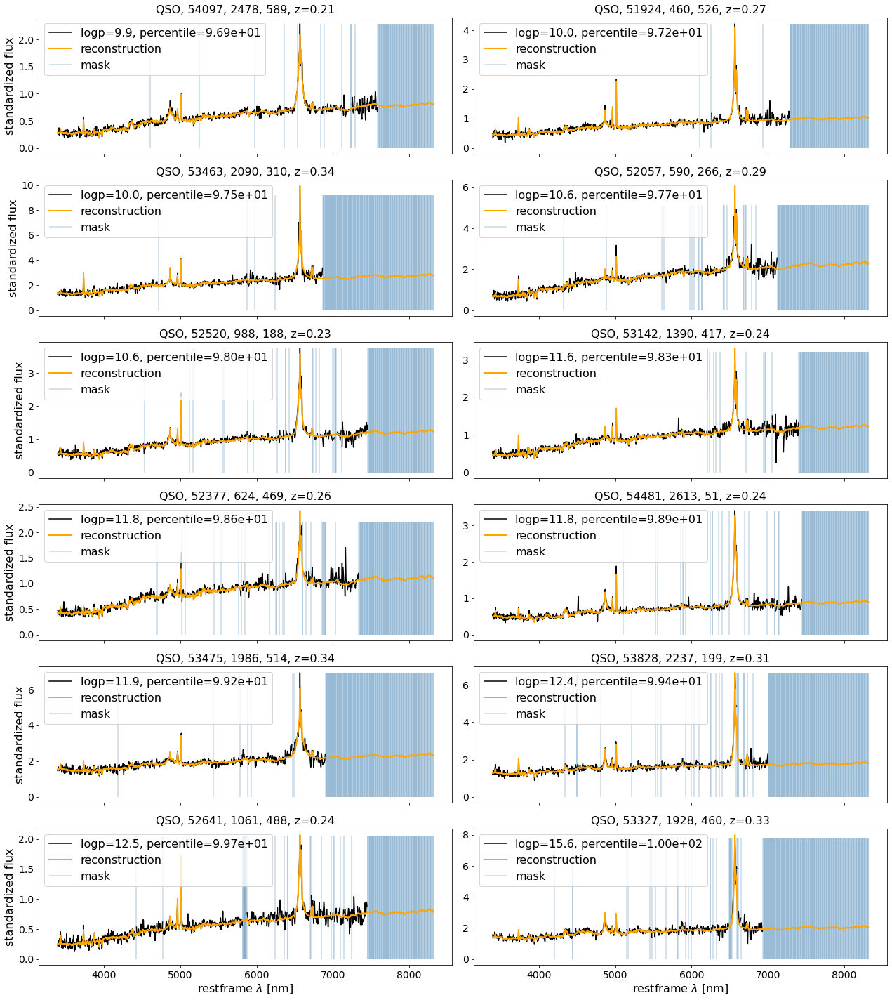

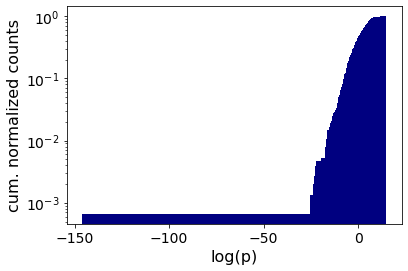

Anomalous Spectra train 6


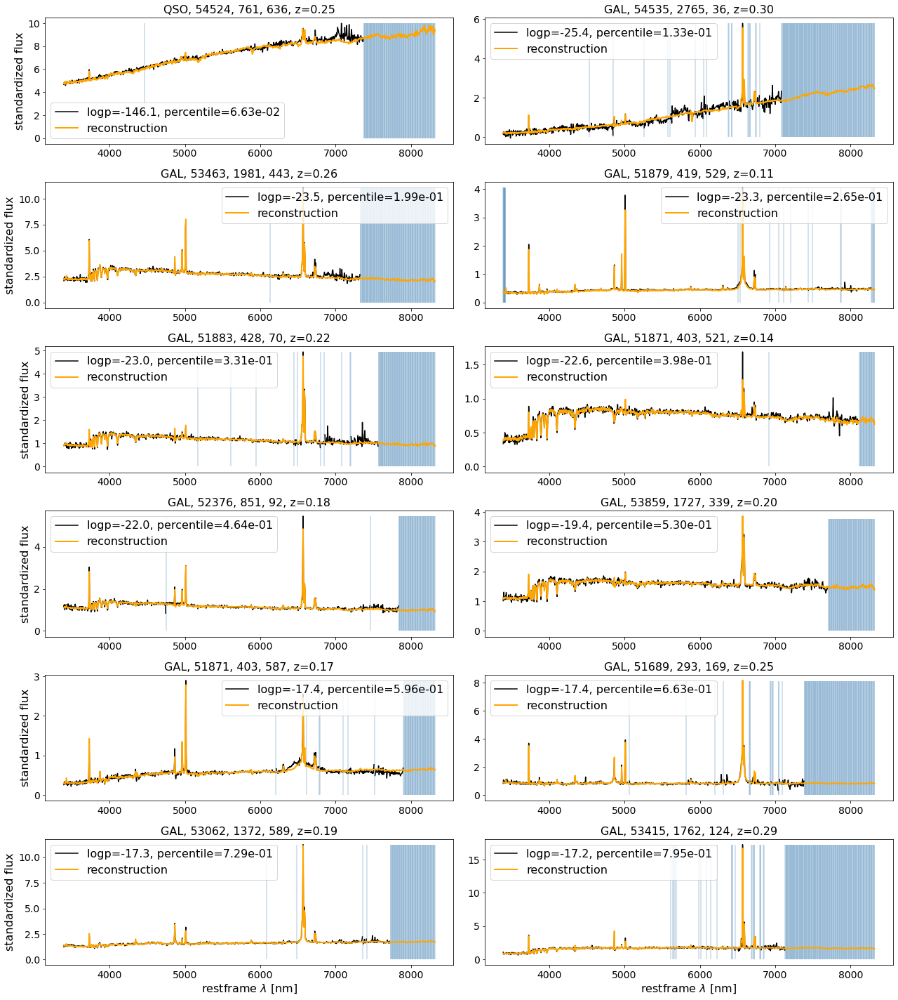

Most normal Spectra train 6


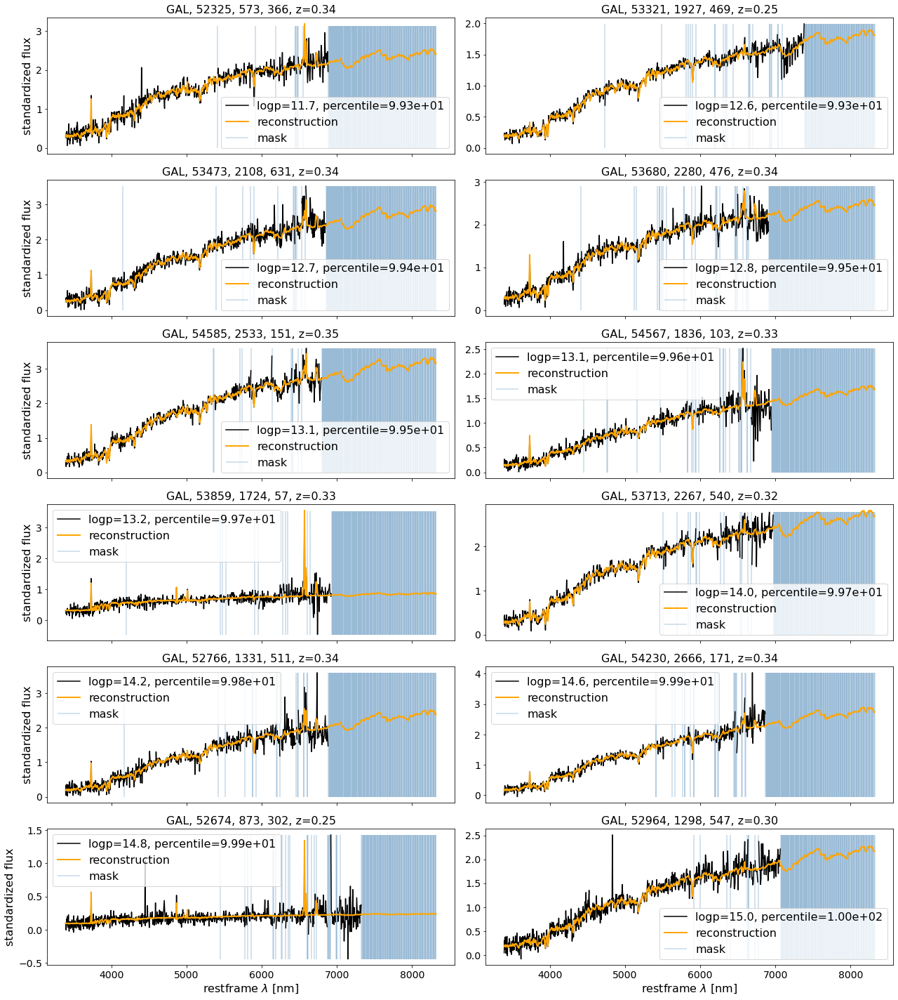

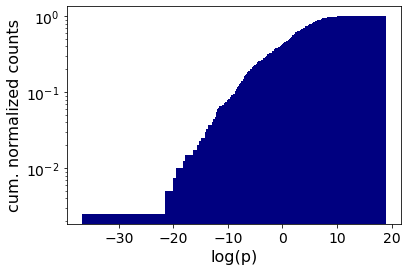

Anomalous Spectra valid 6


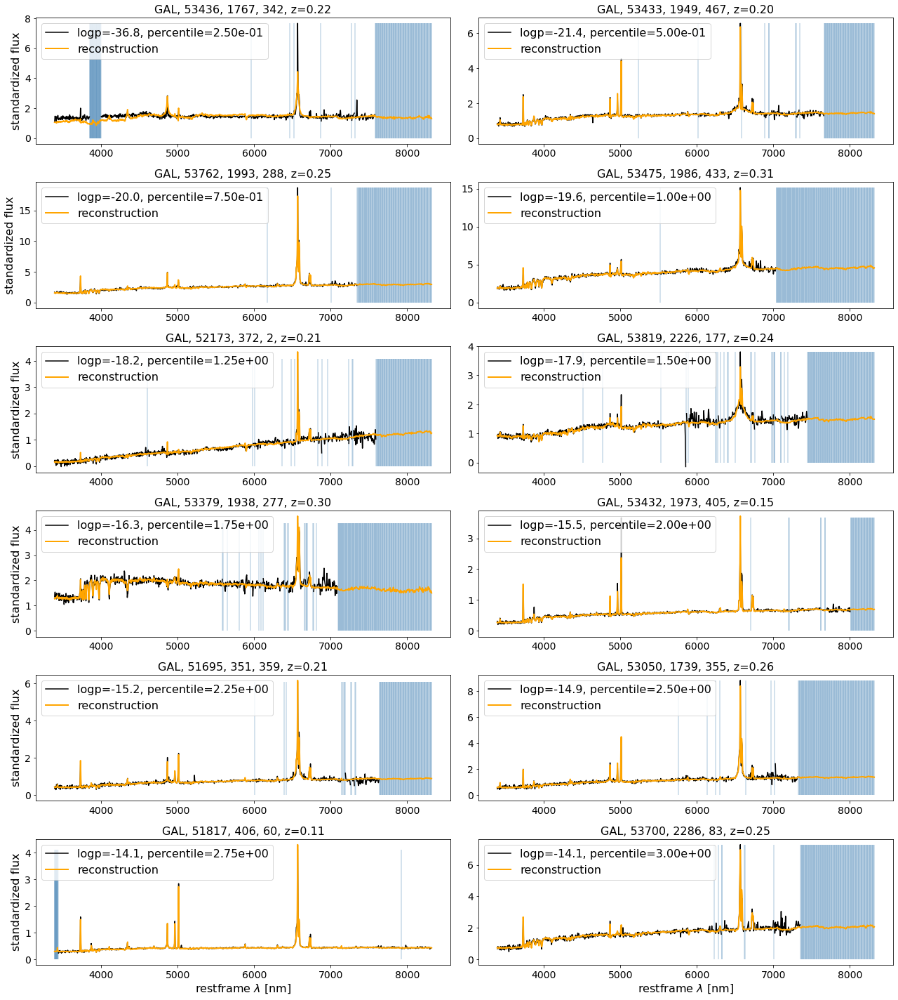

Most normal Spectra valid 6


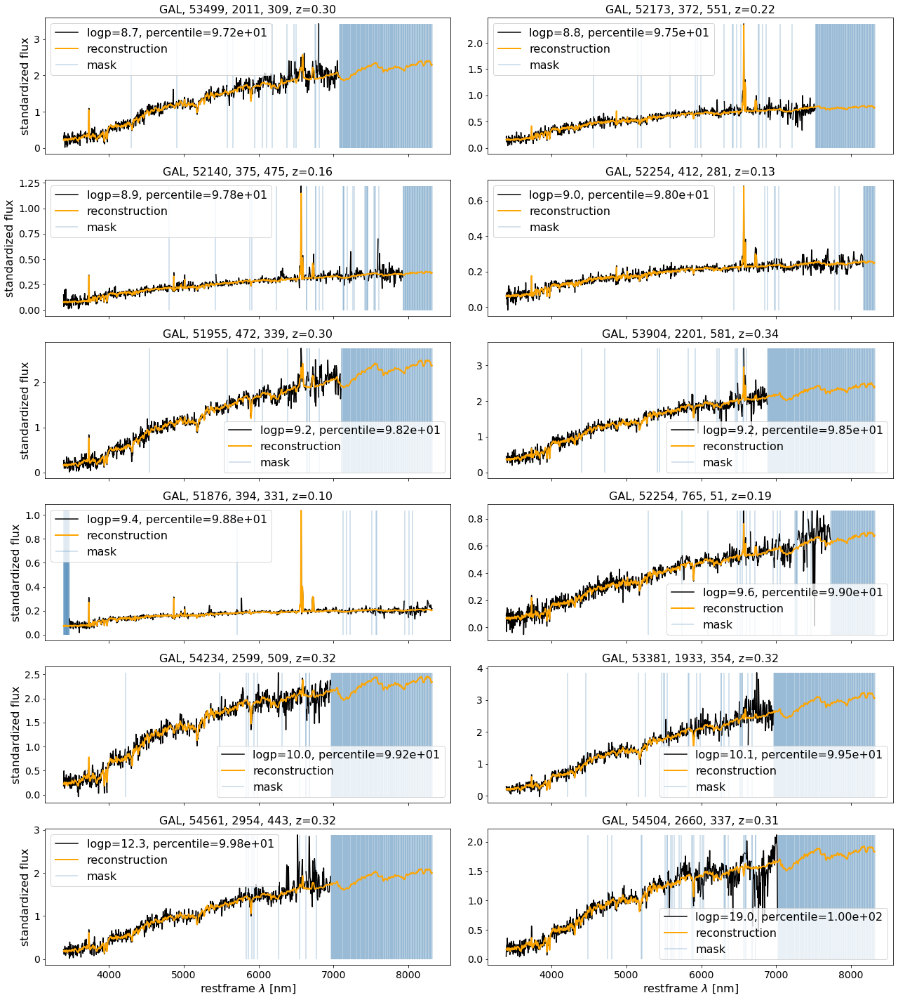

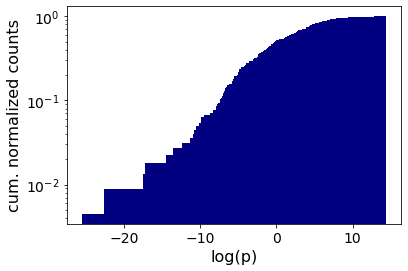

Anomalous Spectra test 6


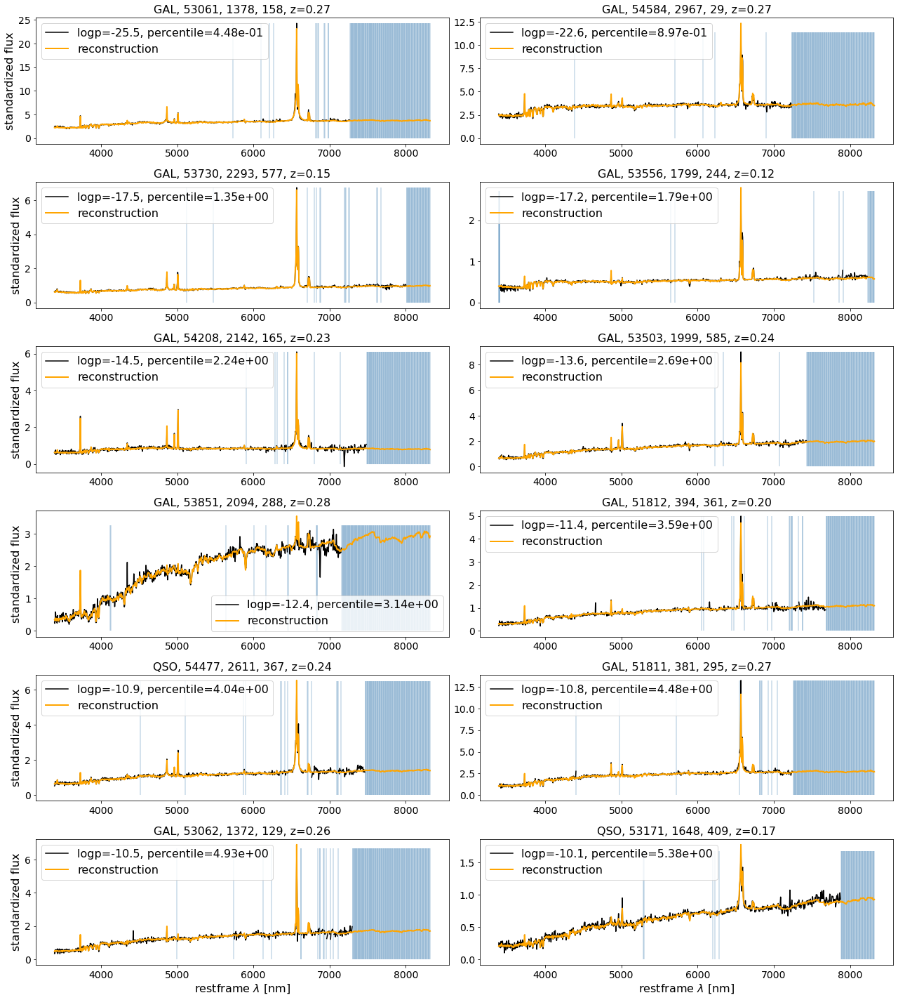

Most normal Spectra test 6


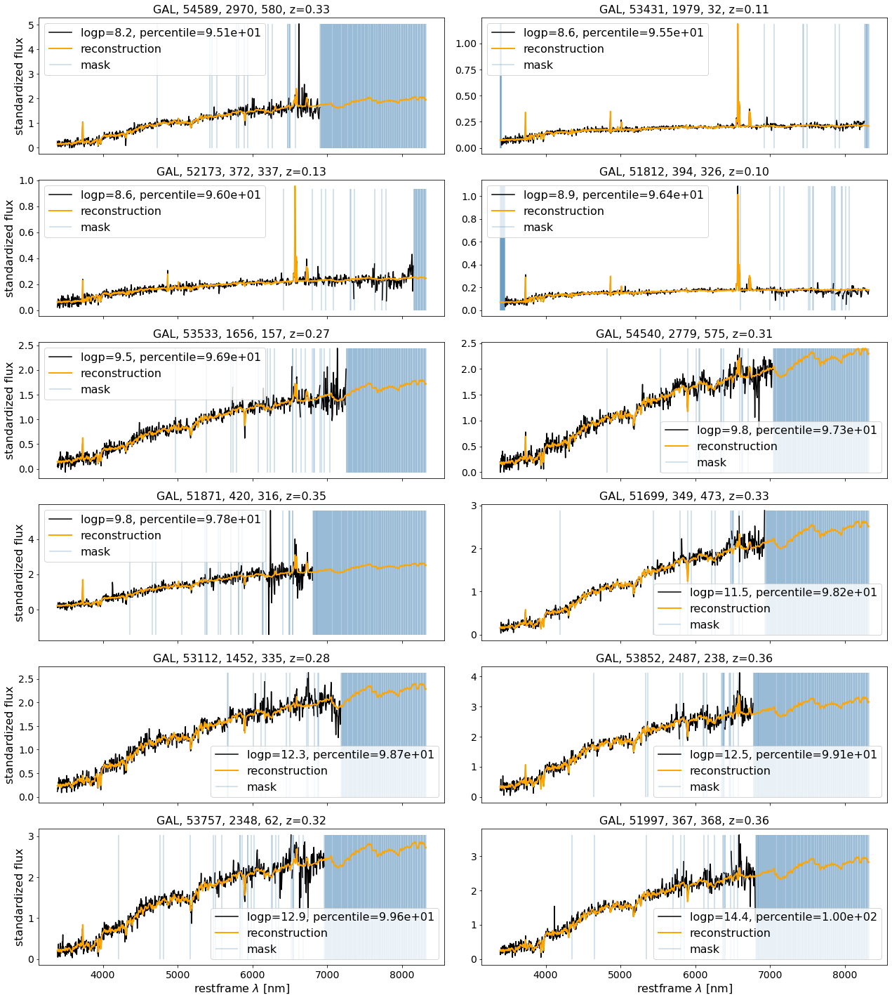

In [ ]:
for mm in range(7):
    for data, name, df in zip([train,valid,test],['train','valid','test'],[df_train,df_valid,df_test]):
        ind = np.where(data['subclass']==mm)[0]

        dens            = df['logp_corr'].iloc[ind].to_numpy()

        ind_ood         = np.argsort(dens)
        dens_sorted     = dens[ind_ood]

        cum, bins, _      = plt.hist(dens_sorted,bins=500,density=True, cumulative=True, log=True, color='navy')
        plt.xlabel('log(p)')
        plt.ylabel('cum. normalized counts')
        plt.savefig(os.path.join(plotpath,'logp_hist_%s_%s.pdf'%(name,(le.inverse_transform([mm])[0]).decode('utf8'))), bbox_inches='tight')
        plt.show()
        plt.close()

        outliers_decoded  = decoded[name][ind][ind_ood]
        outliers_input    = masked[name][ind][ind_ood]

        wlmin, wlmax      = (3388,8318)
        fixed_num_bins    = 1000
        wl_range          = (np.log10(wlmin),np.log10(wlmax))
        new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

        print('Anomalous Spectra', name, mm)
        fi, ax = plt.subplots(6,2,figsize=(18,20))
        ax = ax.flatten()
        for ii in range(12):
            percentile = scipy.stats.percentileofscore(dens_sorted, dens_sorted[ii], kind='rank')
            ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(classes[data['class'][ind][ind_ood][ii]], data['MJD'][ind][ind_ood][ii],data['plate'][ind][ind_ood][ii],data['fiber'][ind][ind_ood][ii],data['z'][ind][ind_ood][ii]))
            ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, percentile=%.2e'%(dens_sorted[ii],percentile), color='black')
            ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ind_ood][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ind_ood][ii]), color='steelblue',alpha=0.3)
            ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)

            ax[ii].legend()
            if ii in [10,11]:
                ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
            if ii%2==0:
                ax[ii].set_ylabel(r'standardized flux')        
        plt.tight_layout()
        plt.savefig(os.path.join(plotpath,'logp_outliers_class_%s_%s.pdf'%(name,(le.inverse_transform([mm])[0]).decode('utf8'))), bbox_inches='tight')
        plt.show()
        plt.close()

        print('Most normal Spectra', name, mm)
        fi, ax = plt.subplots(6,2,figsize=(18,20),sharex=True)
        ax = ax.flatten()
        for nn, ii in enumerate(range(len(ind_ood)-12,len(ind_ood))):
            percentile = scipy.stats.percentileofscore(dens_sorted, dens_sorted[ii], kind='rank')
            ax[nn].set_title('%s, %d, %d, %d, z=%.2f'%(classes[data['class'][ind][ind_ood][ii]], data['MJD'][ind][ind_ood][ii],data['plate'][ind][ind_ood][ii],data['fiber'][ind][ind_ood][ii],data['z'][ind][ind_ood][ii]))
            ax[nn].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, percentile=%.2e'%(dens_sorted[ii],percentile), color='black')
            ax[nn].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ind_ood][ii].astype(bool))], ymin=min(0,min(data['spec'][ind][ind_ood][ii])),ymax=max(data['spec'][ind][ind_ood][ii]), color='steelblue',alpha=0.3, label='mask')
            ax[nn].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
            ax[nn].legend()
            if nn in [10,11]:
                ax[nn].set_xlabel(r'restframe $\lambda$ [nm]')
            if nn%2==0:
                ax[nn].set_ylabel(r'standardized flux')                
        plt.tight_layout()
        plt.savefig(os.path.join(plotpath,'logp_most_common_class_%s_%s.pdf'%(name,(le.inverse_transform([mm])[0]).decode('utf8'))), bbox_inches='tight')
        plt.show()
        plt.close()


In [ ]:
# for mm in range(7):

#     df = df_train.append(df_valid)
#     df = df.append(df_test)
    
#     data = train.copy()
#     data.update(valid)
#     data.update(test)
    
#     decoded_ = np.concatenate([decoded['train'],decoded['valid'],decoded['test']])
#     masked_  = np.concatenate([masked['train'],masked['valid'],masked['test']])
    
#     ind      = np.where(data['subclass']==mm)[0]

#     dens            = df['logp_corr'].iloc[ind].to_numpy()

#     ind_ood         = np.argsort(dens)
#     dens_sorted     = dens[ind_ood]

#     cum, bins, _      = plt.hist(dens_sorted,bins=500,density=True, cumulative=True, log=True, color='navy')
#     plt.xlabel('log(p)')
#     plt.ylabel('cumulative normalized counts')
#     plt.savefig(os.path.join(plotpath,'logp_hist_%s.pdf'%((le.inverse_transform([mm])[0]).decode('utf8'))), bbox_inches='tight')
#     plt.show()
#     plt.close()

#     outliers_decoded  = decoded_[ind][ind_ood]
#     outliers_input    = masked_[ind][ind_ood]

#     wlmin, wlmax      = (3388,8318)
#     fixed_num_bins    = 1000
#     wl_range          = (np.log10(wlmin),np.log10(wlmax))
#     new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

#     print('Anomalous Spectra', mm)
#     fi, ax = plt.subplots(6,2,figsize=(18,20))
#     ax = ax.flatten()
#     for ii in range(12):
#         percentile = scipy.stats.percentileofscore(dens_sorted, dens_sorted[ii], kind='rank')
#         ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(classes[data['class'][ind][ind_ood][ii]], data['MJD'][ind][ind_ood][ii],data['plate'][ind][ind_ood][ii],data['fiber'][ind][ind_ood][ii],data['z'][ind][ind_ood][ii]))
#         ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, percentile=%.2e'%(dens_sorted[ii],percentile), color='black')
#         ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ind_ood][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ind_ood][ii]), color='steelblue',alpha=0.3)
#         ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)

#         ax[ii].legend()
#         if ii in [10,11]:
#             ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
#         if ii%2==0:
#             ax[ii].set_ylabel(r'standardized flux')        
#     plt.tight_layout()
#     plt.savefig(os.path.join(plotpath,'logp_outliers_class_%s.pdf'%((le.inverse_transform([mm])[0]).decode('utf8'))), bbox_inches='tight')
#     plt.show()
#     plt.close()
#     #*(data['z'][ind][ind_ood][ii]+1)

#     print('Most normal Spectra', mm)
#     fi, ax = plt.subplots(6,2,figsize=(18,20),sharex=True)
#     ax = ax.flatten()
#     for nn, ii in enumerate(range(len(ind_ood)-12,len(ind_ood))):
#         percentile = scipy.stats.percentileofscore(dens_sorted, dens_sorted[ii], kind='rank')
#         ax[nn].set_title('%s, %d, %d, %d, z=%.2f'%(classes[data['class'][ind][ind_ood][ii]], data['MJD'][ind][ind_ood][ii],data['plate'][ind][ind_ood][ii],data['fiber'][ind][ind_ood][ii],data['z'][ind][ind_ood][ii]))
#         ax[nn].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, percentile=%.2e'%(dens_sorted[ii],percentile), color='black')
#         ax[nn].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ind_ood][ii].astype(bool))], ymin=min(0,min(data['spec'][ind][ind_ood][ii])),ymax=max(data['spec'][ind][ind_ood][ii]), color='steelblue',alpha=0.3, label='mask')
#         ax[nn].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
#         ax[nn].legend()
#         if nn in [10,11]:
#             ax[nn].set_xlabel(r'restframe $\lambda$ [nm]')
#         if nn%2==0:
#             ax[nn].set_ylabel(r'standardized flux')                
#     plt.tight_layout()
#     plt.savefig(os.path.join(plotpath,'logp_most_common_class_%s.pdf'%((le.inverse_transform([mm])[0]).decode('utf8'))), bbox_inches='tight')
#     plt.show()
#     plt.close()
#     mask_fracs = np.sum(~data['mask'].astype('bool'),axis=1)/1000

#     plt.xlabel('mask fraction')
#     plt.ylabel('logp')
#     plt.scatter(mask_fracs[ind][ind_ood],dens_sorted)
#     plt.show()

#     plt.xlabel('mask fraction')
#     plt.ylabel('logp')
#     plt.scatter(mask_fracs[ind][ind_ood],dens_sorted)
#     plt.show()

In [ ]:
df_extern = pd.read_csv('./external_data/Baronetal_weirdness.csv')

df_train.rename(columns={'MJD':' mjd', 'fiber':' fiber'}, inplace=True)
df_valid.rename(columns={'MJD':' mjd', 'fiber':' fiber'}, inplace=True)
df_test.rename(columns={'MJD':' mjd', 'fiber':' fiber'}, inplace=True)


df_overlap_train = df_extern.merge(df_train,how='inner',on=['plate',' mjd',' fiber'])
df_overlap_valid = df_extern.merge(df_valid,how='inner',on=['plate',' mjd',' fiber'])
df_overlap_test  = df_extern.merge(df_test,how='inner',on=['plate',' mjd',' fiber'])


print(scipy.stats.pearsonr(df_overlap_train['logp'],df_overlap_train[' weirdness']), scipy.stats.pearsonr(df_overlap_train['logp_corr'],df_overlap_train[' weirdness']))
plt.scatter(df_overlap_train[' weirdness'][df_overlap_train['logp_corr']>-60],-df_overlap_train['logp_corr'][df_overlap_train['logp_corr']>-60],s=1)
plt.xlabel('weirdness')
plt.ylabel('-logp')

In [ ]:
print(scipy.stats.pearsonr(df_overlap_train['logp'],df_overlap_train[' weirdness']), scipy.stats.pearsonr(df_overlap_train['logp_corr'],df_overlap_train[' weirdness']))
plt.scatter(df_overlap_train[' weirdness'][df_overlap_train['logp_corr']>-60],np.log(df_overlap_train['max_recon_error'][df_overlap_train['logp_corr']>-60]),s=1)
plt.xlabel('weirdness')
plt.ylabel('maximum recon error')